In [3]:
import os
import shutil
from PIL import Image, ImageEnhance
from collections import Counter
import random
import numpy as np
from sklearn.model_selection import train_test_split

import matplotlib.pyplot as plt
import matplotlib.patches as patches

In [5]:
import os
from PIL import Image
from collections import Counter

def categorize_resolution(width, height):
    """Categorize the resolution into various ranges."""
    if width >= 3840 and height >= 2160:  # 4K and above
        return "4K and above"
    elif (2560 <= width < 3840) and (1440 <= height < 2160):  # 1440p
        return "1440p (2560x1440)"
    elif (2048 <= width < 2560) and (1080 <= height < 1440):  # 2K
        return "2K (2048x1080 to <2560x1440)"
    elif (1920 <= width < 2048) and (1080 <= height < 1152):  # 1080p
        return "1080p (1920x1080 to <2048x1080)"
    elif (1280 <= width < 1920) and (720 <= height < 800):  # 720p
        return "720p (1280x720)"
    elif (1024 <= width < 1280) and (600 <= height < 720):  # 600p
        return "600p (1024x600)"
    elif (640 <= width <= 854) and (480 <= height <= 540):  # 480p
        return "480p (640x480)"
    else:
        return "Other"

def check_image_resolutions(folder_path):
    resolution_categories = Counter()
    for file_name in os.listdir(folder_path):
        file_path = os.path.join(folder_path, file_name)
        try:
            with Image.open(file_path) as img:
                width, height = img.size
                category = categorize_resolution(width, height)
                resolution_categories[category] += 1
        except Exception as e:
            print(f"Error processing file {file_name}: {e}")
    
    print("Resolution Spread:")
    for category, count in resolution_categories.items():
        print(f"{category}: {count}")

# Provide the relative path to your 'images' folder
check_image_resolutions("images")


Resolution Spread:
4K and above (≥3840x2160): 6260
Other: 1737
1440p (2560x1440): 100
2K (2048x1080 to <2560x1440): 2


In [6]:
import os
import shutil
from PIL import Image

def categorize_resolution(width, height):
    if width >= 3840 and height >= 2160:
        return "4K and above (≥3840x2160)"
    else:
        return "Other"

def move_images_to_new_folder(src_folder, dest_folder, resolution_threshold=(3840, 2160)):
    # Create destination folder if it doesn't exist
    os.makedirs(dest_folder, exist_ok=True)
    
    # Loop through all files in the source folder
    for file_name in os.listdir(src_folder):
        file_path = os.path.join(src_folder, file_name)
        
        try:
            with Image.open(file_path) as img:
                width, height = img.size
                # Check if the image resolution is greater than or equal to 4K
                if width >= resolution_threshold[0] and height >= resolution_threshold[1]:
                    # Move the image to the new folder
                    shutil.move(file_path, os.path.join(dest_folder, file_name))
                    print(f"Moved: {file_name}")
        except Exception as e:
            print(f"Error processing file {file_name}: {e}")

# Define source and destination folders
source_folder = "images"  # The original folder containing your images
destination_folder = "foruse/images"  # The new folder where you'll move high-res images

# Call the function to move images
move_images_to_new_folder(source_folder, destination_folder)


Moved: pexels-photo-5409753.jpeg
Moved: pexels-photo-6129019.jpeg
Moved: pexels-photo-7388977.jpeg
Moved: pexels-photo-7089630.jpeg
Moved: pexels-photo-4963444.jpeg
Moved: pexels-photo-13201048.jpeg
Moved: pexels-photo-8985519.jpeg
Moved: pexels-photo-6177619.jpeg
Moved: pexels-photo-6205573.jpeg
Moved: pexels-photo-5493658.jpeg
Moved: work-chinese-industrial-professional.jpg
Moved: pexels-photo-5410122.jpeg
Moved: pexels-photo-2310483.jpeg
Moved: pexels-photo-5668874.jpeg
Moved: pexels-photo-7688082.jpeg
Moved: pexels-photo-6474493.jpeg
Moved: pexels-photo-6077982.jpeg
Moved: pexels-photo-8376243.jpeg
Moved: pexels-photo-5710874.jpeg
Moved: pexels-photo-4489704.jpeg
Moved: pexels-photo-7579187.jpeg
Moved: pexels-photo-6869065.jpeg
Moved: pexels-photo-8278979.jpeg
Moved: pexels-photo-7088534.jpeg
Moved: pexels-photo-5726803.jpeg
Moved: pexels-photo-7519285.jpeg
Moved: pexels-photo-7659564.jpeg
Moved: pexels-photo-8820176.jpeg
Moved: pexels-photo-8518810.jpeg
Moved: pexels-photo-8191959

In [7]:
def count_images_in_folder(folder_path):
    # Get the list of all files in the folder
    image_files = [f for f in os.listdir(folder_path) if os.path.isfile(os.path.join(folder_path, f))]
    
    # Return the number of image files
    return len(image_files)

# Define the folder path
destination_folder = "foruse/images"

# Get and print the count of images in the folder
image_count = count_images_in_folder(destination_folder)
print(f"Number of images in '{destination_folder}': {image_count}")

Number of images in 'foruse/images': 6260


In [1]:
def move_labels(image_folder, label_folder, destination_folder):
    # Create destination folders if they don't exist
    os.makedirs(destination_folder, exist_ok=True)
    
    # Iterate over all image files in the image folder
    for img_file in os.listdir(image_folder):
        if img_file.endswith(('.jpg', '.jpeg', '.png')):  # assuming image files have these extensions
            label_file = img_file.split('.')[0] + '.txt'  # corresponding label file with .txt extension
            label_path = os.path.join(label_folder, label_file)

            # Check if the corresponding label file exists
            if os.path.exists(label_path):
                # Move the label file to the destination folder
                shutil.move(label_path, os.path.join(destination_folder, label_file))
                print(f"Moved label: {label_file}")
            else:
                print(f"Label file not found for: {img_file}")

In [ ]:


# Define paths
image_folder = "foruse/images"
label_folder = "labels"
destination_label_folder = "foruse/labels"

# Move the labels
move_labels(image_folder, label_folder, destination_label_folder)


Moved label: pexels-photo-5409753.txt
Moved label: pexels-photo-6129019.txt
Moved label: pexels-photo-7388977.txt
Moved label: pexels-photo-7089630.txt
Moved label: pexels-photo-4963444.txt
Moved label: pexels-photo-13201048.txt
Moved label: pexels-photo-8985519.txt
Moved label: pexels-photo-6177619.txt
Moved label: pexels-photo-6205573.txt
Moved label: pexels-photo-5493658.txt
Moved label: work-chinese-industrial-professional.txt
Moved label: pexels-photo-5410122.txt
Moved label: pexels-photo-2310483.txt
Moved label: pexels-photo-5668874.txt
Moved label: pexels-photo-7688082.txt
Moved label: pexels-photo-6474493.txt
Moved label: pexels-photo-6077982.txt
Moved label: pexels-photo-8376243.txt
Moved label: pexels-photo-5710874.txt
Moved label: pexels-photo-4489704.txt
Moved label: pexels-photo-7579187.txt
Moved label: pexels-photo-6869065.txt
Moved label: pexels-photo-8278979.txt
Moved label: pexels-photo-7088534.txt
Moved label: pexels-photo-5726803.txt
Moved label: pexels-photo-7519285

In [9]:
# Define the folder path
destination_folder = "foruse/labels"

# Get and print the count of images in the folder
image_count = count_images_in_folder(destination_folder)
print(f"Number of images in '{destination_folder}': {image_count}")

Number of images in 'foruse/labels': 6260


### Split 6260 Raw Images Into 3 Sets

In [11]:
import random

# Directories
images_dir = "foruse/images"
labels_dir = "foruse/labels"
output_base_dir = "foruse/sets"

# Create output directories for the three sets
for set_name in ["set1", "set2", "set3"]:
    os.makedirs(os.path.join(output_base_dir, set_name, "images"), exist_ok=True)
    os.makedirs(os.path.join(output_base_dir, set_name, "labels"), exist_ok=True)

# Get all image filenames
image_filenames = [f for f in os.listdir(images_dir) if f.endswith(('.jpg', '.jpeg', '.png'))]

# Shuffle the filenames randomly
random.shuffle(image_filenames)

# Split into three sets
split_size = len(image_filenames) // 3
set1, set2, set3 = image_filenames[:split_size], image_filenames[split_size:2*split_size], image_filenames[2*split_size:]

# Function to move files
def move_files(file_list, set_name):
    for filename in file_list:
        # Move image file
        src_image_path = os.path.join(images_dir, filename)
        dst_image_path = os.path.join(output_base_dir, set_name, "images", filename)
        shutil.move(src_image_path, dst_image_path)

        # Move corresponding label file
        label_filename = os.path.splitext(filename)[0] + ".txt"
        src_label_path = os.path.join(labels_dir, label_filename)
        dst_label_path = os.path.join(output_base_dir, set_name, "labels", label_filename)
        if os.path.exists(src_label_path):  # Ensure label file exists
            shutil.move(src_label_path, dst_label_path)

# Move files for each set
move_files(set1, "set1")
move_files(set2, "set2")
move_files(set3, "set3")

print("Images and labels have been successfully split into 'set1', 'set2', and 'set3'!")


Images and labels have been successfully split into 'set1', 'set2', and 'set3'!


### For each set, create duplicate sets with different resolutions (480p) and test if the label works

In [2]:
import os
from PIL import Image
from collections import Counter
import random
import shutil
import matplotlib.pyplot as plt
import matplotlib.patches as patches

In [14]:
from PIL import Image

#480p for set 1

# Directories
input_images_dir = "foruse/sets/set1/images"
output_images_dir = "foruse/sets/set1/set1_480p/images"

# Create output directory for resized images
os.makedirs(output_images_dir, exist_ok=True)

# Target resolution for 480p
target_width, target_height = 854, 480

# Resize function
# note here that there are different ways to do resampling. We are using "Image.Resampling.NEAREST" which uses the value of the nearest pixel providing the fastest but low quality resizing. Can be a limitation to consider in reporting. 
def resize_image(input_path, output_path, width, height):
    with Image.open(input_path) as img:
        img_resized = img.resize((width, height), Image.Resampling.NEAREST)
        img_resized.save(output_path)

# Process each image in the set
image_filenames = [f for f in os.listdir(input_images_dir) if f.endswith(('.jpg', '.jpeg', '.png'))]

for filename in image_filenames:
    input_path = os.path.join(input_images_dir, filename)
    output_path = os.path.join(output_images_dir, filename)
    resize_image(input_path, output_path, target_width, target_height)

print(f"Resized images saved in {output_images_dir}. Total images resized: {len(image_filenames)}")


Resized images saved in foruse/sets/set1/set1_480p/images. Total images resized: 2086


In [16]:
# Paths
set1_labels_path = "foruse/sets/set1/labels"
set1_480p_labels_path = "foruse/sets/set1/set1_480p/labels"

# Create directory for resized annotations
os.makedirs(set1_480p_labels_path, exist_ok=True)

# Process each label file
for label_file in os.listdir(set1_labels_path):
    if label_file.endswith('.txt'):
        original_label_path = os.path.join(set1_labels_path, label_file)
        target_label_path = os.path.join(set1_480p_labels_path, label_file)
        
        # Read original label
        with open(original_label_path, 'r') as file:
            lines = file.readlines()

        # Write the same normalized labels to the new folder
        with open(target_label_path, 'w') as file:
            file.writelines(lines)

print("Labels copied to:", set1_480p_labels_path)


Labels copied to: foruse/sets/set1/set1_480p/labels


Visualizing: pexels-photo-5409753.jpeg
Image size: 854 x 480
Bounding Box - Class: hand, X: 416.75200000000007, Y: 190.32, Width: 179.767, Height: 131.88
Bounding Box - Class: hand, X: 241.539382, Y: 219.35999999999999, Width: 150.304, Height: 119.03999999999999
Bounding Box - Class: person, X: 242.53600000000003, Y: 196.68, Width: 611.4639999999999, Height: 283.32000000000005
Displaying image...


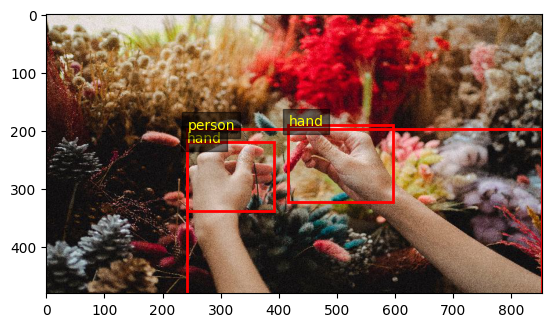

Visualizing: pexels-photo-13201048.jpeg
Image size: 854 x 480
Bounding Box - Class: head, X: 484.85850000000005, Y: 185.92007999999998, Width: 59.993500000000004, Height: 32.079840000000004
Bounding Box - Class: face, X: 486.56649999999996, Y: 203.67984, Width: 32.452, Height: 13.68
Bounding Box - Class: ear, X: 509.19749999999993, Y: 201.67992, Width: 13.237, Height: 6.56016
Bounding Box - Class: tool, X: 387.92949999999996, Y: 206.64000000000001, Width: 52.7345, Height: 3.5999999999999996
Bounding Box - Class: hand, X: 403.3015, Y: 204.55992, Width: 30.743999999999996, Height: 16.64016
Bounding Box - Class: hand, X: 454.32800000000003, Y: 220.00007999999997, Width: 36.721999999999994, Height: 13.52016
Bounding Box - Class: person, X: 403.72850000000005, Y: 186.72, Width: 230.7935, Height: 112.08000000000001
Bounding Box - Class: shoes, X: 477.386, Y: 286.08, Width: 51.4535, Height: 12.479999999999999
Bounding Box - Class: shoes, X: 562.9994999999999, Y: 278.47991999999994, Width: 55.

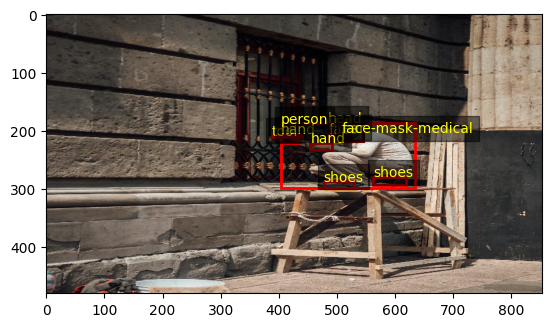

Visualizing: pexels-photo-8985519.jpeg
Image size: 854 x 480
Bounding Box - Class: gloves, X: 254.503956, Y: 26.944319999999994, Width: 154.56546, Height: 176.94432
Bounding Box - Class: gloves, X: 384.189407, Y: 113.47224, Width: 79.22814199999999, Height: 115.97232
Bounding Box - Class: tool, X: 385.857269, Y: 187.36104, Width: 35.721966, Height: 52.916639999999994
Bounding Box - Class: person, X: 0.1392020000000207, Y: 0.13895999999997244, Width: 464.25148, Height: 479.86128
Displaying image...


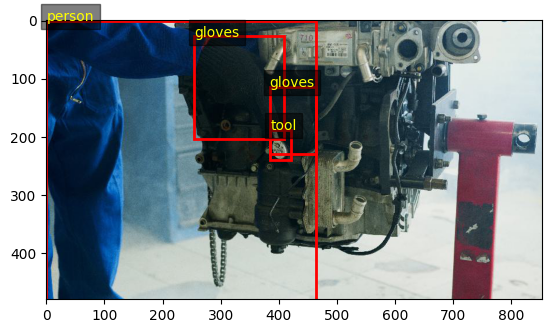

Visualizing: pexels-photo-5493658.jpeg
Image size: 854 x 480
Bounding Box - Class: head, X: 328.79, Y: 85.48943999999999, Width: 114.86300000000001, Height: 125.08416
Bounding Box - Class: ear, X: 362.52299999999997, Y: 155.32056, Width: 11.3155, Height: 25.19664
Bounding Box - Class: faceguard, X: 315.98, Y: 147.76128, Width: 118.4925, Height: 66.05184
Bounding Box - Class: hand, X: 154.57399999999998, Y: 208.41384, Width: 49.959, Height: 43.55472
Bounding Box - Class: hand, X: 543.5709999999999, Y: 429.06624, Width: 38.857, Height: 45.354240000000004
Bounding Box - Class: tool, X: 552.111, Y: 450.3036, Width: 14.945000000000002, Height: 17.6376
Bounding Box - Class: tool, X: 111.2335, Y: 146.32152, Width: 118.27900000000001, Height: 177.27792
Bounding Box - Class: person, X: 156.06849999999997, Y: 85.30944000000002, Width: 427.64050000000003, Height: 394.69056
Bounding Box - Class: helmet, X: 315.98, Y: 87.82871999999999, Width: 126.392, Height: 78.6504
Displaying image...


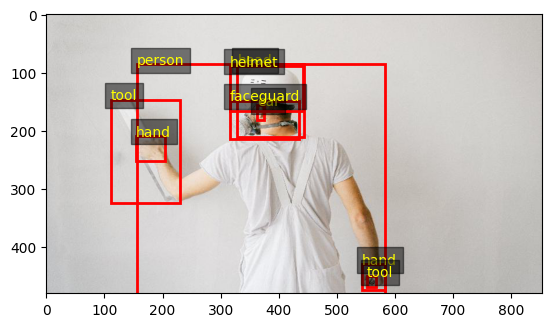

Visualizing: pexels-photo-5668874.jpeg
Image size: 854 x 480
Bounding Box - Class: face, X: 541.5786179999999, Y: 74.27999999999999, Width: 147.742, Height: 154.08
Bounding Box - Class: head, X: 541.151191, Y: 21.840000000000007, Width: 219.193618, Height: 202.56
Bounding Box - Class: ear, X: 677.0798090000001, Y: 140.76, Width: 45.831618, Height: 40.2
Bounding Box - Class: hand, X: 408.212, Y: 247.20000000000002, Width: 67.466, Height: 101.16
Bounding Box - Class: hand, X: 444.507427, Y: 261.12, Width: 144.61038200000002, Height: 121.44
Bounding Box - Class: person, X: 302.03119100000004, Y: 21.12000000000002, Width: 512.257382, Height: 458.88
Displaying image...


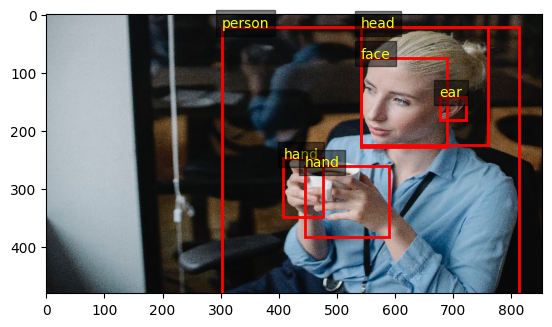

In [7]:
# Paths
images_path = "foruse/sets/set1/set1_480p/images"
labels_path = "foruse/sets/set1/set1_480p/labels"

# Class name mapping
class_name = {
    11: 'hand', 
    0: 'person',
    12: 'head',
    3: 'face',
    1: 'ear',
    7: 'tool',
    14: 'shoes',
    9: 'gloves',
    8: 'glasses',
    10: 'helmet',
    6: 'foot',
    5: 'face-mask-medical',
    16: 'safety-vest',
    2: 'ear-muffs',
    15: 'safety-suit',
    13: 'medical-suit',
    4: 'faceguard'
}

# Function to visualize an image with bounding boxes
def visualize_image_with_annotations(image_file, label_file):
    try:
        # Open the image
        img = Image.open(image_file)
        fig, ax = plt.subplots(1)
        ax.imshow(img)

        # Image dimensions
        img_width, img_height = img.size
        print(f"Image size: {img_width} x {img_height}")  # Debugging

        # Read the annotation file
        with open(label_file, 'r') as file:
            lines = file.readlines()

        # Add bounding boxes
        for line in lines:
            parts = line.strip().split()
            if len(parts) != 5:
                print(f"Skipping invalid line: {line}")
                continue

            # Extract class ID and bounding box coordinates
            class_id, cx, cy, w, h = int(parts[0]), float(parts[1]), float(parts[2]), float(parts[3]), float(parts[4])

            # Convert normalized values to pixel values
            x = (cx - w / 2) * img_width
            y = (cy - h / 2) * img_height
            width = w * img_width
            height = h * img_height

            # Get class name or default to "Unknown"
            label = class_name.get(class_id, "Unknown")

            print(f"Bounding Box - Class: {label}, X: {x}, Y: {y}, Width: {width}, Height: {height}")  # Debugging

            # Add a rectangle patch
            rect = patches.Rectangle((x, y), width, height, linewidth=2, edgecolor='r', facecolor='none')
            ax.add_patch(rect)
            plt.text(x, y, label, color="yellow", fontsize=10, bbox=dict(facecolor='black', alpha=0.5))

        print("Displaying image...")
        plt.show()

    except Exception as e:
        print(f"Error processing {image_file}: {e}")

# Visualize a few samples
sample_files = os.listdir(images_path)[:5]  # Change the number to view more samples
for sample in sample_files:
    if sample.lower().endswith((".jpeg", ".jpg")):
        image_file = os.path.join(images_path, sample)
        # Replace extensions to find the corresponding label file
        label_file = os.path.join(labels_path, sample.replace(".jpeg", ".txt").replace(".jpg", ".txt"))
        if os.path.exists(label_file):
            print(f"Visualizing: {sample}")
            visualize_image_with_annotations(image_file, label_file)
        else:
            print(f"No label file found for {sample}")


Visualizing: pexels-photo-5409753.jpeg
Image size: 6000 x 4000
Bounding Box - Class: hand, X: 2928.0000000000005, Y: 1585.9999999999998, Width: 1263.0, Height: 1099.0
Bounding Box - Class: hand, X: 1696.998, Y: 1827.9999999999998, Width: 1056.0, Height: 992.0
Bounding Box - Class: person, X: 1704.0000000000002, Y: 1639.0, Width: 4296.0, Height: 2361.0
Displaying image...


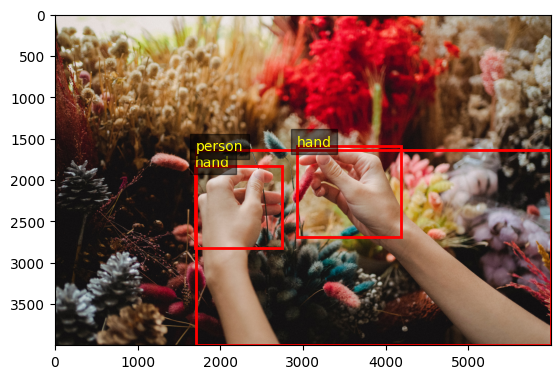

Visualizing: pexels-photo-13201048.jpeg
Image size: 4000 x 6000
Bounding Box - Class: head, X: 2271.0000000000005, Y: 2324.001, Width: 281.0, Height: 400.99800000000005
Bounding Box - Class: face, X: 2279.0, Y: 2545.998, Width: 152.0, Height: 171.0
Bounding Box - Class: ear, X: 2385.0, Y: 2520.999, Width: 62.0, Height: 82.002
Bounding Box - Class: tool, X: 1817.0, Y: 2583.0000000000005, Width: 247.0, Height: 45.0
Bounding Box - Class: hand, X: 1889.0, Y: 2556.999, Width: 144.0, Height: 208.002
Bounding Box - Class: hand, X: 2128.0, Y: 2750.0009999999997, Width: 172.0, Height: 169.002
Bounding Box - Class: person, X: 1891.0000000000002, Y: 2334.0, Width: 1081.0, Height: 1401.0
Bounding Box - Class: shoes, X: 2236.0, Y: 3576.0, Width: 241.0, Height: 156.0
Bounding Box - Class: shoes, X: 2636.9999999999995, Y: 3480.9989999999993, Width: 262.0, Height: 181.002
Bounding Box - Class: face-mask-medical, X: 2379.0, Y: 2537.0009999999997, Width: 71.0, Height: 184.002
Displaying image...


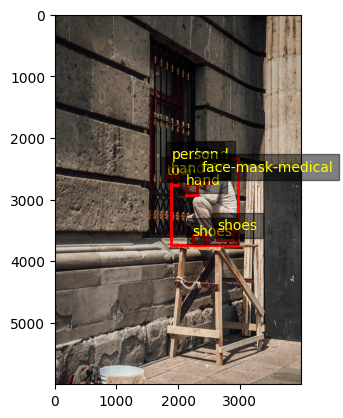

Visualizing: pexels-photo-8985519.jpeg
Image size: 6144 x 3456
Bounding Box - Class: gloves, X: 1830.998016, Y: 193.99910399999996, Width: 1112.0025600000001, Height: 1273.999104
Bounding Box - Class: gloves, X: 2764.004352, Y: 817.000128, Width: 569.997312, Height: 835.0007039999999
Bounding Box - Class: tool, X: 2776.003584, Y: 1348.999488, Width: 256.997376, Height: 380.999808
Bounding Box - Class: person, X: 1.001472000000149, Y: 1.0005119999998016, Width: 3340.00128, Height: 3455.001216
Displaying image...


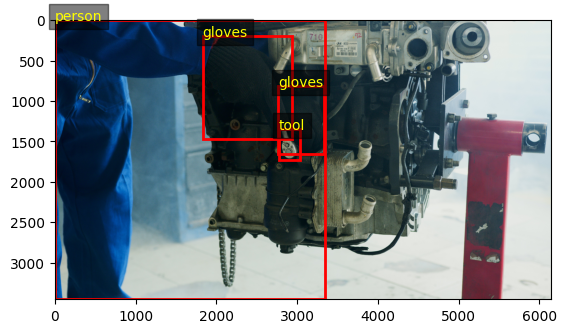

Visualizing: pexels-photo-5493658.jpeg
Image size: 4000 x 2667
Bounding Box - Class: head, X: 1540.0, Y: 475.00070099999994, Width: 538.0, Height: 694.998864
Bounding Box - Class: ear, X: 1698.0, Y: 862.9998615, Width: 53.0, Height: 139.998831
Bounding Box - Class: faceguard, X: 1480.0, Y: 820.998612, Width: 555.0, Height: 367.000536
Bounding Box - Class: hand, X: 724.0, Y: 1157.9993985, Width: 234.0, Height: 242.000913
Bounding Box - Class: hand, X: 2546.0, Y: 2383.999296, Width: 182.0, Height: 251.999496
Bounding Box - Class: tool, X: 2586.0, Y: 2501.9993775000003, Width: 70.0, Height: 97.998915
Bounding Box - Class: tool, X: 521.0, Y: 812.9989455, Width: 554.0, Height: 985.000443
Bounding Box - Class: person, X: 730.9999999999999, Y: 474.00057600000014, Width: 2003.0, Height: 2192.999424
Bounding Box - Class: helmet, X: 1480.0, Y: 487.99832549999996, Width: 592.0, Height: 437.001285
Displaying image...


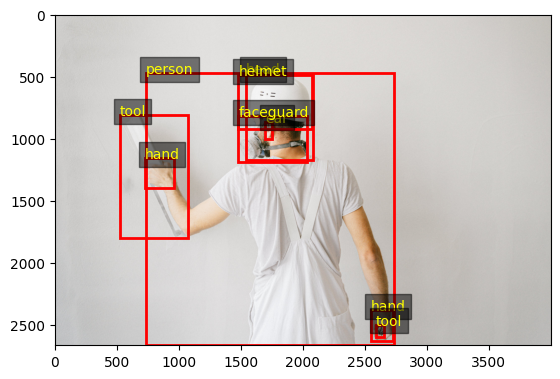

Visualizing: pexels-photo-5668874.jpeg
Image size: 6000 x 4000
Bounding Box - Class: face, X: 3805.0019999999995, Y: 618.9999999999999, Width: 1038.0, Height: 1284.0
Bounding Box - Class: head, X: 3801.9990000000003, Y: 182.00000000000006, Width: 1540.002, Height: 1688.0
Bounding Box - Class: ear, X: 4757.001, Y: 1173.0, Width: 322.002, Height: 335.0
Bounding Box - Class: hand, X: 2868.0, Y: 2060.0, Width: 474.0, Height: 843.0
Bounding Box - Class: hand, X: 3123.003, Y: 2176.0, Width: 1015.998, Height: 1012.0
Bounding Box - Class: person, X: 2121.9990000000003, Y: 176.00000000000017, Width: 3598.9979999999996, Height: 3824.0
Displaying image...


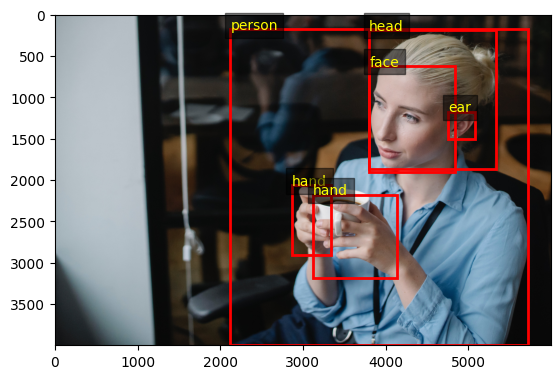

In [19]:
#compare with the original resolution

# Paths
images_path_ori = "foruse/sets/set1/images"
labels_path_ori = "foruse/sets/set1/labels"

#visualize same samples but original resolution
for sample in sample_files:
    if sample.endswith(".jpg") or sample.endswith(".jpeg"):
        image_file = os.path.join(images_path_ori, sample)
        label_file = os.path.join(labels_path_ori, sample.replace(".jpg", ".txt").replace(".jpeg", ".txt"))
        if os.path.exists(label_file):
            print(f"Visualizing: {sample}")
            visualize_image_with_annotations(image_file, label_file)
        else:
            print(f"No label file found for {sample}")


### Replicate above for 1080p

In [20]:
from PIL import Image

#1080p for set 1

# Directories
input_images_dir = "foruse/sets/set1/images"
output_images_dir = "foruse/sets/set1/set1_1080p/images"

# Create output directory for resized images
os.makedirs(output_images_dir, exist_ok=True)

# Target resolution for 1080p
target_width, target_height = 1920, 1080

# Resize function
# note here that there are different ways to do resampling. We are using "Image.Resampling.NEAREST" which uses the value of the nearest pixel providing the fastest but low quality resizing. Can be a limitation to consider in reporting. 
def resize_image(input_path, output_path, width, height):
    with Image.open(input_path) as img:
        img_resized = img.resize((width, height), Image.Resampling.NEAREST)
        img_resized.save(output_path)

# Process each image in the set
image_filenames = [f for f in os.listdir(input_images_dir) if f.endswith(('.jpg', '.jpeg', '.png'))]

for filename in image_filenames:
    input_path = os.path.join(input_images_dir, filename)
    output_path = os.path.join(output_images_dir, filename)
    resize_image(input_path, output_path, target_width, target_height)

print(f"Resized images saved in {output_images_dir}. Total images resized: {len(image_filenames)}")


Resized images saved in foruse/sets/set1/set1_1080p/images. Total images resized: 2086


In [21]:
# Paths
set1_labels_path = "foruse/sets/set1/labels"
set1_1080p_labels_path = "foruse/sets/set1/set1_1080p/labels"

# Create directory for resized annotations
os.makedirs(set1_1080p_labels_path, exist_ok=True)

# Process each label file
for label_file in os.listdir(set1_labels_path):
    if label_file.endswith('.txt'):
        original_label_path = os.path.join(set1_labels_path, label_file)
        target_label_path = os.path.join(set1_1080p_labels_path, label_file)
        
        # Read original label
        with open(original_label_path, 'r') as file:
            lines = file.readlines()

        # Write the same normalized labels to the new folder
        with open(target_label_path, 'w') as file:
            file.writelines(lines)

print("Labels copied to:", set1_1080p_labels_path)


Labels copied to: foruse/sets/set1/set1_1080p/labels


Visualizing: pexels-photo-7688082.jpeg
Image size: 1920 x 1080
Bounding Box - Class: head, X: 1243.2287999999999, Y: 6.944399999999991, Width: 549.55008, Height: 487.61568
Bounding Box - Class: face, X: 1245.6451199999997, Y: 142.50978, Width: 248.80704000000003, Height: 352.65348
Bounding Box - Class: head, X: 766.1472000000001, Y: 0.30240000000000267, Width: 376.83456, Height: 339.06600000000003
Bounding Box - Class: face, X: 778.62816, Y: 101.44818, Width: 315.2352, Height: 238.8258
Bounding Box - Class: hand, X: 756.48576, Y: 356.57820000000004, Width: 161.84447999999998, Height: 209.23703999999998
Bounding Box - Class: hand, X: 767.3548800000001, Y: 709.53246, Width: 340.19712000000004, Height: 179.64828
Bounding Box - Class: hand, X: 294.30048000000005, Y: 862.91352, Width: 343.82016000000004, Height: 217.08648
Bounding Box - Class: ear, X: 1062.46272, Y: 95.10749999999999, Width: 66.42815999999999, Height: 95.10804
Bounding Box - Class: ear, X: 1477.9449600000003, Y: 277.17012, 

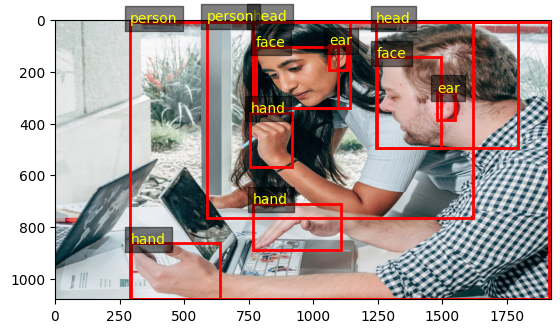

Visualizing: pexels-photo-6474493.jpeg
Image size: 1920 x 1080
Bounding Box - Class: ear, X: 1061.70432, Y: 268.90704, Width: 29.61408, Height: 31.49712
Bounding Box - Class: ear, X: 873.34464, Y: 271.45638, Width: 13.5936, Height: 21.1194
Bounding Box - Class: hand, X: 1190.35104, Y: 641.0448000000001, Width: 75.24672, Height: 51.159600000000005
Bounding Box - Class: hand, X: 656.8291200000001, Y: 651.60558, Width: 102.91776, Height: 47.15388
Bounding Box - Class: head, X: 846.1583999999999, Y: 205.00289999999998, Width: 266.03328, Height: 132.72444000000002
Bounding Box - Class: person, X: 633.0412799999999, Y: 180.06138, Width: 709.2595200000001, Height: 880.45812
Displaying image...


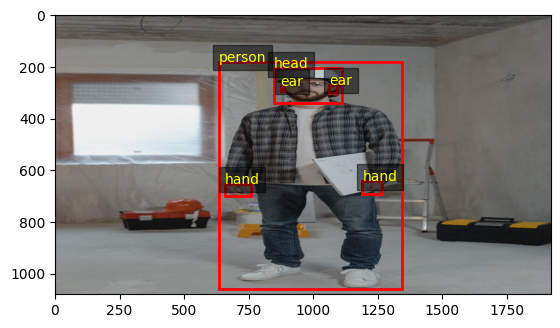

Visualizing: pexels-photo-6077982.jpeg
Image size: 1920 x 1080
Bounding Box - Class: head, X: 524.5967999999999, Y: 392.61888, Width: 242.90879999999999, Height: 192.44304000000002
Bounding Box - Class: face, X: 655.0416, Y: 408.97818000000007, Width: 112.81728, Height: 176.67827999999997
Bounding Box - Class: head, X: 1278.70752, Y: 157.34574, Width: 222.10752000000002, Height: 255.79692
Bounding Box - Class: face, X: 1279.4112, Y: 241.81793999999996, Width: 153.00863999999999, Height: 171.02772
Bounding Box - Class: ear, X: 1398.9273600000001, Y: 252.8226, Width: 48.29952, Height: 60.08256
Bounding Box - Class: hand, X: 724.1414399999999, Y: 808.1413200000001, Width: 93.4272, Height: 52.943760000000005
Bounding Box - Class: hand, X: 765.0374400000001, Y: 828.0694799999999, Width: 162.17472, Height: 69.3036
Bounding Box - Class: hand, X: 1269.5414400000002, Y: 881.6077799999999, Width: 130.79616000000001, Height: 102.91428
Bounding Box - Class: hand, X: 1282.9372799999999, Y: 773.3410

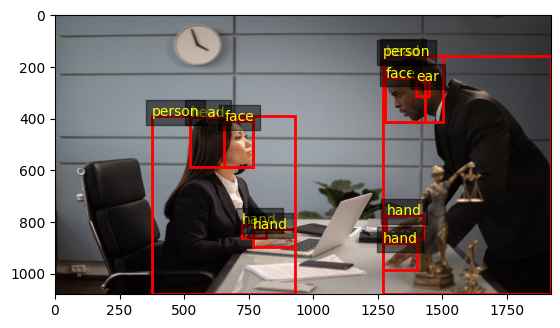

Visualizing: pexels-photo-8376243.jpeg
Image size: 1920 x 1080
Bounding Box - Class: head, X: 1014.24, Y: 319.86036, Width: 473.28, Height: 232.2
Bounding Box - Class: face, X: 1015.1999999999999, Y: 391.68036, Width: 355.2, Height: 160.38
Bounding Box - Class: hand, X: 863.04, Y: 876.78018, Width: 185.76, Height: 85.67964
Bounding Box - Class: ear, X: 1350.72, Y: 437.03982, Width: 107.04, Height: 64.07964
Bounding Box - Class: glasses, X: 985.4399999999999, Y: 421.56018, Width: 397.91999999999996, Height: 54.359640000000006
Bounding Box - Class: person, X: 503.5200000000001, Y: 318.96018, Width: 1236.48, Height: 662.9396399999999
Bounding Box - Class: tool, X: 915.36, Y: 511.74018, Width: 712.8000000000001, Height: 287.46036
Displaying image...


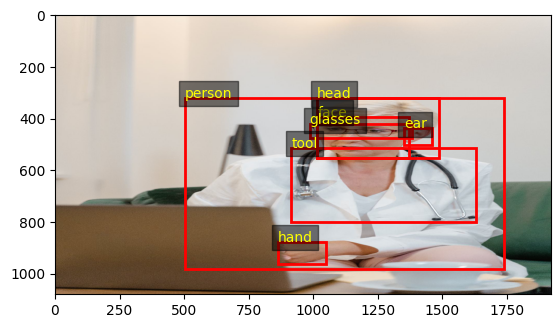

Visualizing: pexels-photo-4489704.jpeg
Image size: 1920 x 1080
Bounding Box - Class: head, X: 1002.0096, Y: 475.47702000000004, Width: 71.87711999999999, Height: 68.12316
Bounding Box - Class: face, X: 1000.69824, Y: 488.76966, Width: 60.06144, Height: 57.32316
Bounding Box - Class: gloves, X: 919.632, Y: 444.18456000000003, Width: 42.0096, Height: 32.676480000000005
Bounding Box - Class: gloves, X: 1066.0099199999997, Y: 539.16894, Width: 33.1488, Height: 43.75404
Bounding Box - Class: person, X: 896.6553600000001, Y: 436.15368000000007, Width: 232.36991999999998, Height: 491.26176
Bounding Box - Class: shoes, X: 928.82112, Y: 893.0773800000001, Width: 55.7952, Height: 22.430519999999998
Bounding Box - Class: shoes, X: 1043.0352, Y: 903.0463199999999, Width: 37.415040000000005, Height: 20.49192
Displaying image...


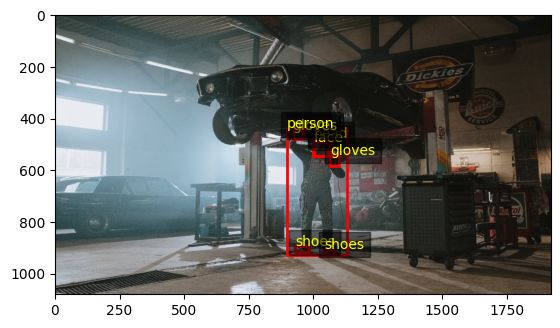

In [23]:
#visualize the same sample images

sample_files = os.listdir(images_path)[5:10]

# Paths
images_path_1080 = "foruse/sets/set1/set1_1080p/images"
labels_path_1080 = "foruse/sets/set1/set1_1080p/labels"

#visualize same samples but original resolution
for sample in sample_files:
    if sample.endswith(".jpg") or sample.endswith(".jpeg"):
        image_file = os.path.join(images_path_1080, sample)
        label_file = os.path.join(labels_path_1080, sample.replace(".jpg", ".txt").replace(".jpeg", ".txt"))
        if os.path.exists(label_file):
            print(f"Visualizing: {sample}")
            visualize_image_with_annotations(image_file, label_file)
        else:
            print(f"No label file found for {sample}")


Visualizing: pexels-photo-7688082.jpeg
Image size: 4769 x 3577
Bounding Box - Class: head, X: 3087.999035, Y: 23.000109999999967, Width: 1365.002256, Height: 1615.001192
Bounding Box - Class: face, X: 3094.0008214999993, Y: 471.99766950000003, Width: 618.000403, Height: 1168.001387
Bounding Box - Class: head, X: 1902.9979150000001, Y: 1.0015600000000089, Width: 936.002092, Height: 1122.99915
Bounding Box - Class: face, X: 1933.9987995, Y: 336.00012949999996, Width: 782.998265, Height: 790.999895
Bounding Box - Class: hand, X: 1879.000307, Y: 1181.000205, Width: 401.99808599999994, Height: 693.000826
Bounding Box - Class: hand, X: 1905.997616, Y: 2349.9977865, Width: 845.000034, Height: 595.001757
Bounding Box - Class: hand, X: 730.9994735, Y: 2858.001538, Width: 853.999137, Height: 718.998462
Bounding Box - Class: ear, X: 2639.002454, Y: 314.99956249999997, Width: 164.997862, Height: 315.001351
Bounding Box - Class: ear, X: 3670.9997470000003, Y: 917.997703, Width: 171.998754, Height: 

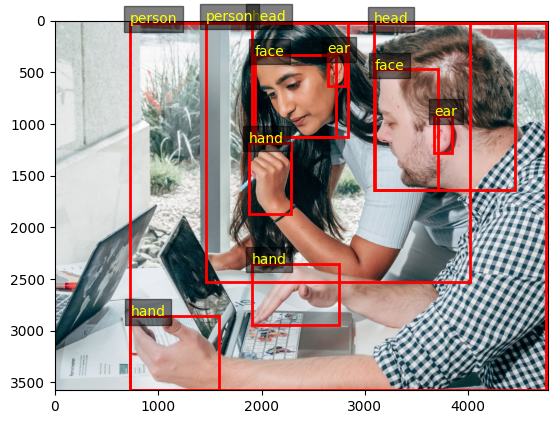

Visualizing: pexels-photo-6474493.jpeg
Image size: 3955 x 5932
Bounding Box - Class: ear, X: 2187.000305, Y: 1476.996816, Width: 61.00192, Height: 173.000848
Bounding Box - Class: ear, X: 1798.9989850000002, Y: 1490.9993020000002, Width: 28.0014, Height: 116.00026
Bounding Box - Class: hand, X: 2451.9991475, Y: 3520.9979200000007, Width: 155.000405, Height: 280.99884000000003
Bounding Box - Class: hand, X: 1352.9995675, Y: 3579.003982, Width: 211.999865, Height: 258.997052
Bounding Box - Class: head, X: 1742.9981624999998, Y: 1125.99741, Width: 548.0008449999999, Height: 729.001276
Bounding Box - Class: person, X: 1303.999095, Y: 989.0038020000002, Width: 1461.00073, Height: 4835.997748000001
Displaying image...


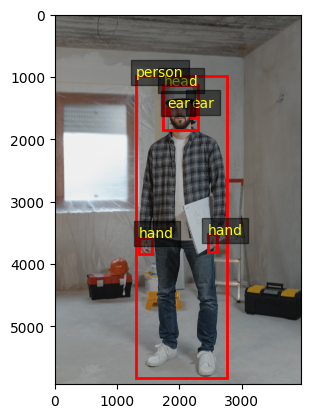

Visualizing: pexels-photo-6077982.jpeg
Image size: 5446 x 3631
Bounding Box - Class: head, X: 1487.9969649999998, Y: 1319.999216, Width: 689.00069, Height: 647.000628
Bounding Box - Class: face, X: 1857.998205, Y: 1374.9997885000002, Width: 320.001514, Height: 593.998921
Bounding Box - Class: head, X: 3627.000601, Y: 529.0022055, Width: 629.998726, Height: 859.998719
Bounding Box - Class: face, X: 3628.9965599999996, Y: 813.0008704999999, Width: 434.002632, Height: 575.001529
Bounding Box - Class: ear, X: 3967.9991680000003, Y: 849.9989449999999, Width: 136.99957600000002, Height: 201.999792
Bounding Box - Class: hand, X: 2053.997022, Y: 2717.001049, Width: 265.00236, Height: 177.998882
Bounding Box - Class: hand, X: 2169.996822, Y: 2784.0002609999997, Width: 460.00183599999997, Height: 233.00127
Bounding Box - Class: hand, X: 3601.0013970000005, Y: 2963.9980084999997, Width: 370.997858, Height: 346.001621
Bounding Box - Class: hand, X: 3638.998139, Y: 2600.0011515, Width: 405.002682, 

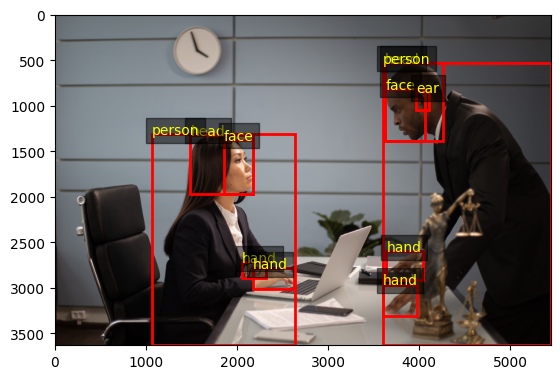

Visualizing: pexels-photo-8376243.jpeg
Image size: 4000 x 6000
Bounding Box - Class: head, X: 2113.0, Y: 1777.0020000000002, Width: 986.0, Height: 1290.0
Bounding Box - Class: face, X: 2114.9999999999995, Y: 2176.002, Width: 740.0, Height: 891.0
Bounding Box - Class: hand, X: 1798.0, Y: 4871.001, Width: 387.0, Height: 475.998
Bounding Box - Class: ear, X: 2814.0, Y: 2427.9990000000003, Width: 223.0, Height: 355.998
Bounding Box - Class: glasses, X: 2053.0, Y: 2342.001, Width: 829.0, Height: 301.998
Bounding Box - Class: person, X: 1049.0000000000002, Y: 1772.0009999999997, Width: 2576.0, Height: 3682.9979999999996
Bounding Box - Class: tool, X: 1907.0, Y: 2843.001, Width: 1485.0, Height: 1597.002
Displaying image...


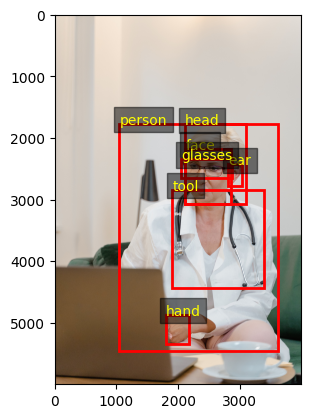

Visualizing: pexels-photo-4489704.jpeg
Image size: 5850 x 3900
Bounding Box - Class: head, X: 3052.998, Y: 1717.0003500000003, Width: 219.0006, Height: 246.00029999999998
Bounding Box - Class: face, X: 3049.00245, Y: 1765.00155, Width: 182.9997, Height: 207.0003
Bounding Box - Class: gloves, X: 2802.00375, Y: 1603.9998, Width: 127.998, Height: 117.9984
Bounding Box - Class: gloves, X: 3247.9989749999995, Y: 1946.9989500000001, Width: 101.00025, Height: 158.0007
Bounding Box - Class: person, X: 2731.9968000000003, Y: 1574.9994000000002, Width: 708.0020999999999, Height: 1774.0008
Bounding Box - Class: shoes, X: 2830.00185, Y: 3225.00165, Width: 170.001, Height: 80.9991
Bounding Box - Class: shoes, X: 3177.997875, Y: 3261.0006, Width: 113.99895000000001, Height: 73.99860000000001
Displaying image...


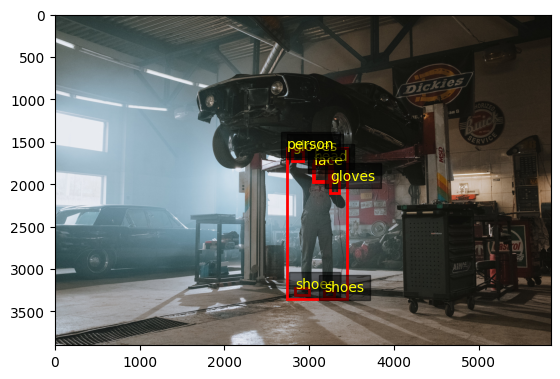

In [24]:
#compare with the original resolution

# Paths
images_path_ori = "foruse/sets/set1/images"
labels_path_ori = "foruse/sets/set1/labels"

#visualize same samples but original resolution
for sample in sample_files:
    if sample.endswith(".jpg") or sample.endswith(".jpeg"):
        image_file = os.path.join(images_path_ori, sample)
        label_file = os.path.join(labels_path_ori, sample.replace(".jpg", ".txt").replace(".jpeg", ".txt"))
        if os.path.exists(label_file):
            print(f"Visualizing: {sample}")
            visualize_image_with_annotations(image_file, label_file)
        else:
            print(f"No label file found for {sample}")

### Replicate for 4K

In [4]:
#4k for set 1

# Directories
input_images_dir = "foruse/sets/set1/images"
output_images_dir = "foruse/sets/set1/set1_4k/images"

# Create output directory for resized images
os.makedirs(output_images_dir, exist_ok=True)

# Target resolution for 4k
target_width, target_height = 3840, 2160

# Resize function
# note here that there are different ways to do resampling. We are using "Image.Resampling.NEAREST" which uses the value of the nearest pixel providing the fastest but low quality resizing. Can be a limitation to consider in reporting. 
def resize_image(input_path, output_path, width, height):
    with Image.open(input_path) as img:
        img_resized = img.resize((width, height), Image.Resampling.NEAREST)
        img_resized.save(output_path)

# Process each image in the set
image_filenames = [f for f in os.listdir(input_images_dir) if f.endswith(('.jpg', '.jpeg', '.png'))]

for filename in image_filenames:
    input_path = os.path.join(input_images_dir, filename)
    output_path = os.path.join(output_images_dir, filename)
    resize_image(input_path, output_path, target_width, target_height)

print(f"Resized images saved in {output_images_dir}. Total images resized: {len(image_filenames)}")

Resized images saved in foruse/sets/set1/set1_4k/images. Total images resized: 2086


In [5]:
# Paths
set1_labels_path = "foruse/sets/set1/labels"
set1_4k_labels_path = "foruse/sets/set1/set1_4k/labels"

# Create directory for resized annotations
os.makedirs(set1_4k_labels_path, exist_ok=True)

# Process each label file
for label_file in os.listdir(set1_labels_path):
    if label_file.endswith('.txt'):
        original_label_path = os.path.join(set1_labels_path, label_file)
        target_label_path = os.path.join(set1_4k_labels_path, label_file)
        
        # Read original label
        with open(original_label_path, 'r') as file:
            lines = file.readlines()

        # Write the same normalized labels to the new folder
        with open(target_label_path, 'w') as file:
            file.writelines(lines)

print("Labels copied to:", set1_4k_labels_path)

Labels copied to: foruse/sets/set1/set1_4k/labels


Visualizing: pexels-photo-7519285.jpeg
Image size: 3840 x 2160
Bounding Box - Class: hand, X: 1433.616, Y: 1445.67396, Width: 444.4608, Height: 333.4932
Bounding Box - Class: head, X: 1020.67776, Y: 46.274759999999965, Width: 815.7888, Height: 898.3591200000001
Bounding Box - Class: face, X: 1203.50592, Y: 509.54939999999993, Width: 614.67648, Height: 437.74344
Bounding Box - Class: ear, X: 1133.52768, Y: 562.73832, Width: 102.76224, Height: 116.48447999999999
Bounding Box - Class: glasses, X: 1354.81152, Y: 606.35304, Width: 462.10944, Height: 238.81824
Bounding Box - Class: tool, X: 1431.09696, Y: 1314.8297999999998, Width: 697.2633599999999, Height: 593.58744
Bounding Box - Class: person, X: 93.93600000000009, Y: 42.01956000000015, Width: 1866.09792, Height: 2117.98152
Displaying image...


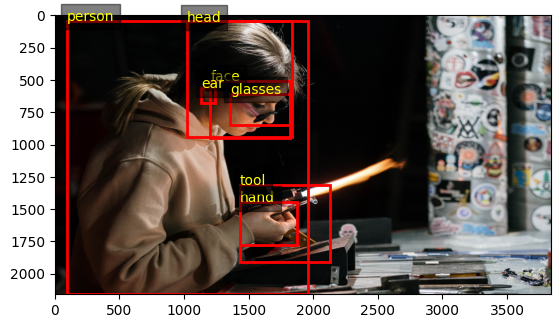

Visualizing: pexels-photo-8518810.jpeg
Image size: 3840 x 2160
Bounding Box - Class: face, X: 1214.3750400000001, Y: 373.74912, Width: 178.74816, Height: 208.12464
Bounding Box - Class: head, X: 1215.00096, Y: 340.0002, Width: 245.62559999999996, Height: 245.62439999999998
Bounding Box - Class: face, X: 1811.8752, Y: 789.37524, Width: 158.74944000000002, Height: 197.49960000000002
Bounding Box - Class: head, X: 1801.87392, Y: 731.87496, Width: 282.50111999999996, Height: 260.6256
Bounding Box - Class: face, X: 2565.0009600000003, Y: 828.12456, Width: 156.2496, Height: 213.74928
Bounding Box - Class: head, X: 2513.1264, Y: 790.00056, Width: 213.74975999999998, Height: 252.49968
Bounding Box - Class: face, X: 2875.62432, Y: 620.62416, Width: 111.24864, Height: 298.7496
Bounding Box - Class: head, X: 2875.00032, Y: 533.1258, Width: 353.74848, Height: 385.00056
Bounding Box - Class: glasses, X: 1818.1248, Y: 826.25076, Width: 161.24928, Height: 79.99992
Bounding Box - Class: ear, X: 1960.6

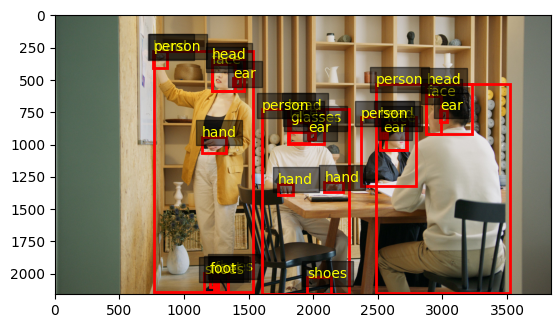

Visualizing: pexels-photo-11427444.jpeg
Image size: 3840 x 2160
Bounding Box - Class: head, X: 1814.4, Y: 538.9189200000001, Width: 444.48, Height: 271.44072
Bounding Box - Class: face, X: 1851.8400000000001, Y: 653.75964, Width: 382.08000000000004, Height: 151.91928000000001
Bounding Box - Class: ear, X: 2238.72, Y: 633.6003599999999, Width: 56.64, Height: 52.55928
Bounding Box - Class: ear, X: 1792.32, Y: 642.23928, Width: 58.56, Height: 43.2
Bounding Box - Class: gloves, X: 602.8800000000001, Y: 1177.9203599999998, Width: 452.15999999999997, Height: 125.64072
Bounding Box - Class: gloves, X: 2304.0, Y: 1180.4410799999998, Width: 171.84, Height: 146.51928
Bounding Box - Class: tool, X: 1770.2399999999998, Y: 1018.4410799999999, Width: 106.56, Height: 151.91928000000001
Bounding Box - Class: shoes, X: 1837.4399999999998, Y: 1553.75928, Width: 411.84, Height: 123.12
Bounding Box - Class: shoes, X: 2060.16, Y: 1640.16036, Width: 329.28000000000003, Height: 112.68072
Bounding Box - Class

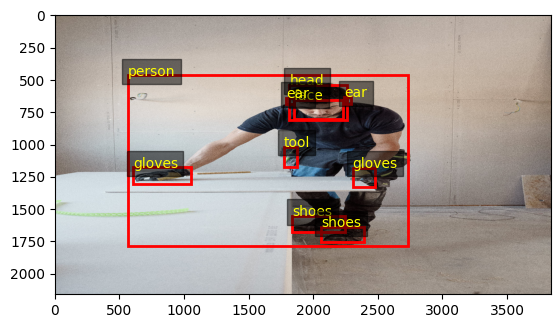

Visualizing: pexels-photo-4349948.jpeg
Image size: 3840 x 2160
Bounding Box - Class: hand, X: 1801.89888, Y: 971.14788, Width: 949.9200000000001, Height: 1003.9874400000001
Bounding Box - Class: hand, X: 1064.49984, Y: 0.0, Width: 1046.5728, Height: 542.4321600000001
Bounding Box - Class: person, X: 0.0, Y: -0.001079999999911152, Width: 3497.54112, Height: 2088.85176
Displaying image...


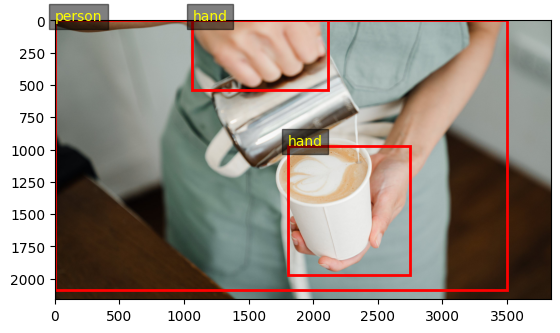

Visualizing: pexels-photo-7475045.jpeg
Image size: 3840 x 2160
Bounding Box - Class: hand, X: 1835.5199999999998, Y: 502.2, Width: 428.16, Height: 367.20000000000005
Bounding Box - Class: hand, X: 3340.8, Y: 467.28036, Width: 384.96000000000004, Height: 365.40072000000004
Bounding Box - Class: head, X: 2364.48, Y: 782.27964, Width: 851.52, Height: 418.32072
Bounding Box - Class: face, X: 2430.7200000000003, Y: 852.4796399999999, Width: 729.6, Height: 356.03928
Bounding Box - Class: ear, X: 3144.0000000000005, Y: 919.07892, Width: 68.16, Height: 121.32072000000001
Bounding Box - Class: ear, X: 2366.3999999999996, Y: 933.8403599999999, Width: 95.04, Height: 120.59928000000001
Bounding Box - Class: person, X: 702.7200000000003, Y: 465.4800000000001, Width: 3137.2799999999997, Height: 1694.52
Displaying image...


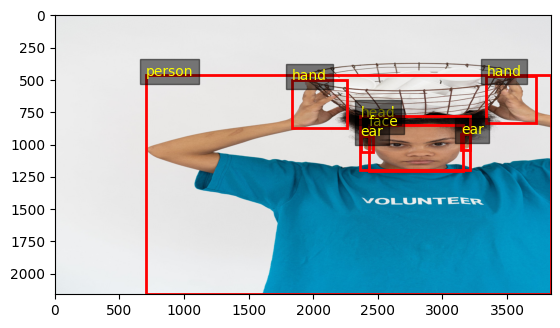

In [9]:
#visualize the same sample images

# Paths
images_path = "foruse/sets/set1/set1_4k/images"
labels_path = "foruse/sets/set1/set1_4k/labels"

sample_files = os.listdir(images_path)[11:16]

# Paths
images_path_4k = "foruse/sets/set1/set1_4k/images"
labels_path_4k = "foruse/sets/set1/set1_4k/labels"

#visualize same samples but original resolution
for sample in sample_files:
    if sample.endswith(".jpg") or sample.endswith(".jpeg"):
        image_file = os.path.join(images_path_4k, sample)
        label_file = os.path.join(labels_path_4k, sample.replace(".jpg", ".txt").replace(".jpeg", ".txt"))
        if os.path.exists(label_file):
            print(f"Visualizing: {sample}")
            visualize_image_with_annotations(image_file, label_file)
        else:
            print(f"No label file found for {sample}")

Visualizing: pexels-photo-7519285.jpeg
Image size: 6091 x 4061
Bounding Box - Class: hand, X: 2273.9987125, Y: 2718.0009035, Width: 705.002795, Height: 626.998095
Bounding Box - Class: head, X: 1618.9969365000002, Y: 87.00083349999994, Width: 1294.002495, Height: 1688.998327
Bounding Box - Class: face, X: 1908.998583, Y: 958.0000524999998, Width: 974.9985519999999, Height: 822.998199
Bounding Box - Class: ear, X: 1797.9992445, Y: 1058.000147, Width: 163.001251, Height: 219.00160799999998
Bounding Box - Class: glasses, X: 2148.9992105, Y: 1139.999859, Width: 732.997031, Height: 449.000404
Bounding Box - Class: tool, X: 2270.0030165, Y: 2472.0017674999995, Width: 1105.997689, Height: 1115.9993490000002
Bounding Box - Class: person, X: 149.00108750000015, Y: 79.00066350000027, Width: 2960.0006329999997, Height: 3982.001367
Displaying image...


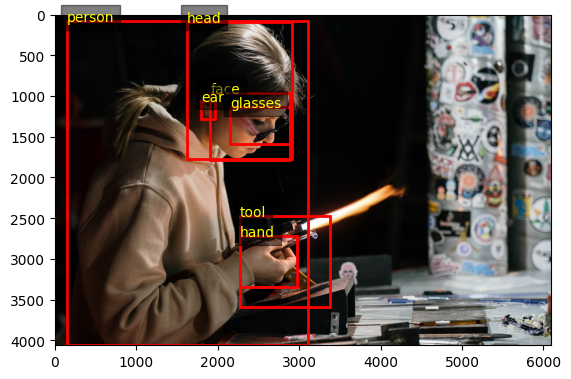

Visualizing: pexels-photo-8518810.jpeg
Image size: 6144 x 3456
Bounding Box - Class: face, X: 1943.000064, Y: 597.9985919999999, Width: 285.997056, Height: 332.999424
Bounding Box - Class: head, X: 1944.0015360000002, Y: 544.00032, Width: 393.00095999999996, Height: 392.99904
Bounding Box - Class: face, X: 2899.00032, Y: 1263.000384, Width: 253.99910400000002, Height: 315.99936
Bounding Box - Class: head, X: 2882.998272, Y: 1170.999936, Width: 452.00179199999997, Height: 417.00096
Bounding Box - Class: face, X: 4104.001536, Y: 1324.999296, Width: 249.99935999999997, Height: 341.998848
Bounding Box - Class: head, X: 4021.0022400000003, Y: 1264.000896, Width: 341.999616, Height: 403.999488
Bounding Box - Class: face, X: 4600.998911999999, Y: 992.9986559999999, Width: 177.997824, Height: 477.99935999999997
Bounding Box - Class: head, X: 4600.000512, Y: 853.0012800000001, Width: 565.997568, Height: 616.000896
Bounding Box - Class: glasses, X: 2908.99968, Y: 1322.001216, Width: 257.998848, 

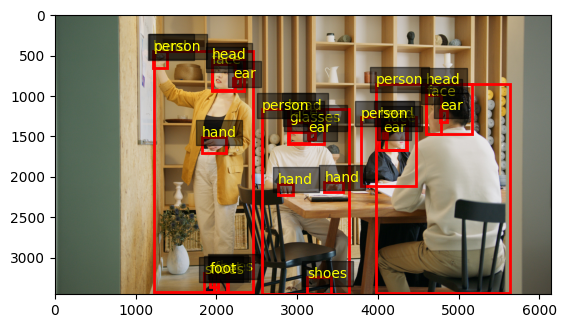

Visualizing: pexels-photo-11427444.jpeg
Image size: 4000 x 6000
Bounding Box - Class: head, X: 1890.0000000000002, Y: 1496.9970000000003, Width: 463.0, Height: 754.002
Bounding Box - Class: face, X: 1929.0, Y: 1815.999, Width: 398.0, Height: 421.99800000000005
Bounding Box - Class: ear, X: 2332.0, Y: 1760.0009999999997, Width: 59.0, Height: 145.998
Bounding Box - Class: ear, X: 1867.0, Y: 1783.998, Width: 61.0, Height: 120.0
Bounding Box - Class: gloves, X: 628.0000000000001, Y: 3272.0009999999993, Width: 471.0, Height: 349.002
Bounding Box - Class: gloves, X: 2400.0, Y: 3279.0029999999997, Width: 179.0, Height: 406.99800000000005
Bounding Box - Class: tool, X: 1843.9999999999998, Y: 2829.003, Width: 111.0, Height: 421.99800000000005
Bounding Box - Class: shoes, X: 1914.0, Y: 4315.998, Width: 429.0, Height: 342.0
Bounding Box - Class: shoes, X: 2146.0, Y: 4556.001, Width: 343.0, Height: 313.002
Bounding Box - Class: person, X: 588.0000000000001, Y: 1290.9990000000003, Width: 2259.0, He

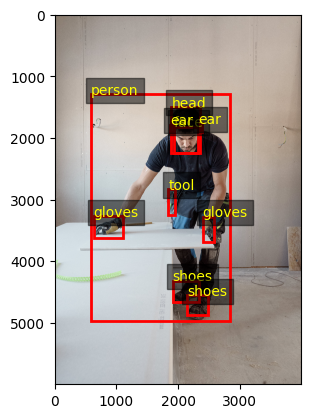

Visualizing: pexels-photo-4349948.jpeg
Image size: 5999 x 3552
Bounding Box - Class: hand, X: 2814.9977555, Y: 1596.998736, Width: 1484.002625, Height: 1651.0015680000001
Bounding Box - Class: hand, X: 1663.0037865, Y: 0.0, Width: 1634.997455, Height: 891.9995520000001
Bounding Box - Class: person, X: 0.0, Y: -0.0017759999998538945, Width: 5463.997182, Height: 3435.0006719999997
Displaying image...


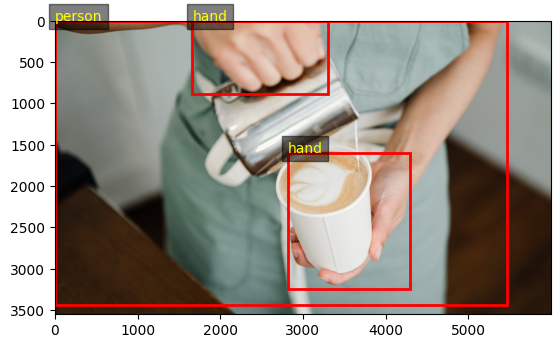

Visualizing: pexels-photo-7475045.jpeg
Image size: 4000 x 6000
Bounding Box - Class: hand, X: 1911.9999999999998, Y: 1395.0, Width: 446.0, Height: 1020.0000000000001
Bounding Box - Class: hand, X: 3480.0, Y: 1298.001, Width: 401.0, Height: 1015.0020000000001
Bounding Box - Class: head, X: 2463.0, Y: 2172.999, Width: 887.0, Height: 1162.002
Bounding Box - Class: face, X: 2532.0, Y: 2367.999, Width: 760.0, Height: 988.998
Bounding Box - Class: ear, X: 3275.0000000000005, Y: 2552.9970000000003, Width: 71.0, Height: 337.002
Bounding Box - Class: ear, X: 2465.0, Y: 2594.0009999999997, Width: 99.0, Height: 334.998
Bounding Box - Class: person, X: 732.0000000000002, Y: 1293.0000000000002, Width: 3268.0, Height: 4707.0
Displaying image...


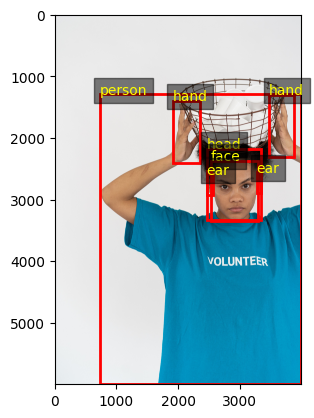

In [10]:
#compare with the original resolution

# Paths
images_path_ori = "foruse/sets/set1/images"
labels_path_ori = "foruse/sets/set1/labels"

#visualize same samples but original resolution
for sample in sample_files:
    if sample.endswith(".jpg") or sample.endswith(".jpeg"):
        image_file = os.path.join(images_path_ori, sample)
        label_file = os.path.join(labels_path_ori, sample.replace(".jpg", ".txt").replace(".jpeg", ".txt"))
        if os.path.exists(label_file):
            print(f"Visualizing: {sample}")
            visualize_image_with_annotations(image_file, label_file)
        else:
            print(f"No label file found for {sample}")

### Simulate Image Quality for Camera Hardware

Justification for Simulating Camera Hardware Quality
To emulate varying levels of camera hardware quality, we adjusted key image properties such as resolution, brightness, and noise. These adjustments were chosen to reflect the characteristics of cameras across different quality tiers:

1. Low-Quality Cameras (480p)
Noise Type: Salt-and-Pepper Noise
Simulates hardware defects or poor image transmission quality often seen in low-tier cameras.
Abrupt pixel distortions (random black-and-white specks) represent issues like faulty sensors or severe environmental interference.
Brightness: Reduced Brightness (0.5x)
Low-quality cameras often struggle in low-light conditions, leading to underexposed or poorly lit images. This reduction in brightness simulates the inability of such cameras to capture sufficient light, resulting in dark, unclear images.
Rationale: Salt-and-pepper noise is highly destructive, making object detection and recognition significantly more challenging. Combined with low brightness, it mirrors the real-world limitations of low-quality cameras.
2. Mid-Quality Cameras (1080p)
Noise Type: Gaussian Noise
Mimics moderate graininess caused by electronic noise, such as thermal sensor noise or low-light shooting with higher ISO settings.
Brightness: Moderate Brightness (0.8x)
Mid-quality cameras can handle moderate lighting conditions but may still struggle in low-light scenarios, leading to slightly darker images compared to high-tier cameras. The moderate brightness reflects this balance.
Rationale: Gaussian noise produces more natural-looking distortions compared to salt-and-pepper, aligning with the characteristics of mid-tier cameras that are better equipped to capture details but still limited under challenging conditions. The moderate brightness simulates the camera's capability to deal with average lighting environments.
3. High-Quality Cameras (4K)
Noise Level: None
High-tier cameras are assumed to have advanced sensor technology and image processing capabilities, minimizing noise.
Brightness: Increased Brightness (1.2x)
High-quality cameras excel in capturing images in various lighting conditions, including low-light environments. This increase in brightness reflects the camera's ability to produce clear, well-lit images even in challenging conditions.
Rationale: High-resolution imagery without noticeable noise simulates premium hardware, where the focus is on clarity and capturing finer details. The increased brightness represents a high-end camera's ability to capture well-lit, vibrant images.


#### 480p

In [1]:
import os
from PIL import Image, ImageEnhance
import numpy as np

# Function to adjust brightness
def adjust_brightness(input_image, factor):
    enhancer = ImageEnhance.Brightness(input_image)
    return enhancer.enhance(factor)

# Function to add salt-and-pepper noise
def add_salt_and_pepper_noise(input_image, prob=0.04):
    img_array = np.array(input_image)
    noisy_image = img_array.copy()
    num_pixels = img_array.shape[0] * img_array.shape[1]

    # Add salt noise
    num_salt = int(prob * num_pixels)
    salt_coords = [np.random.randint(0, i, num_salt) for i in img_array.shape[:2]]
    noisy_image[salt_coords[0], salt_coords[1], :] = 255

    # Add pepper noise
    num_pepper = int(prob * num_pixels)
    pepper_coords = [np.random.randint(0, i, num_pepper) for i in img_array.shape[:2]]
    noisy_image[pepper_coords[0], pepper_coords[1], :] = 0

    return Image.fromarray(noisy_image)

In [1]:
# Directory paths
input_dir = "foruse/sets/set1/set1_480p/images"
output_dir = "foruse/sets/set1/set1_480p/quality_adjusted/images"
os.makedirs(output_dir, exist_ok=True)

# Parameters for 480p set
brightness_factor = 0.5  # Dim lighting
noise_probability = 0.04  # Salt-and-pepper noise level

# Process images
for image_file in os.listdir(input_dir):
    if image_file.endswith((".jpg", ".jpeg", ".png")):
        img_path = os.path.join(input_dir, image_file)
        output_path = os.path.join(output_dir, image_file)

        with Image.open(img_path) as img:
            # Adjust brightness
            img = adjust_brightness(img, brightness_factor)

            # Add salt-and-pepper noise
            img = add_salt_and_pepper_noise(img, prob=noise_probability)

            # Save the processed image
            img.save(output_path)

print(f"Processed images for set1_480p with adjustments saved in {output_dir}.")


Processed images for set1_480p with adjustments saved in foruse/sets/set1/set1_480p/quality_adjusted/images.


In [3]:
def movelabels(origin,destination):
    # Create directory for resized annotations
    os.makedirs(destination, exist_ok=True)

    # Process each label file
    for label_file in os.listdir(origin):
        if label_file.endswith('.txt'):
            original_label_path = os.path.join(origin, label_file)
            target_label_path = os.path.join(destination, label_file)
            
            # Read original label
            with open(original_label_path, 'r') as file:
                lines = file.readlines()
    
            # Write the same normalized labels to the new folder
            with open(target_label_path, 'w') as file:
                file.writelines(lines)

    print("Labels copied to:", destination) 

In [5]:
#Paths
origin = "foruse/sets/set1/set1_480p/labels"
destination = "foruse/sets/set1/set1_480p/quality_adjusted/labels"

movelabels(origin,destination)


Labels copied to: foruse/sets/set1/set1_480p/quality_adjusted/labels


In [4]:
# Class name mapping
class_name = {
    11: 'hand', 
    0: 'person',
    12: 'head',
    3: 'face',
    1: 'ear',
    7: 'tool',
    14: 'shoes',
    9: 'gloves',
    8: 'glasses',
    10: 'helmet',
    6: 'foot',
    5: 'face-mask-medical',
    16: 'safety-vest',
    2: 'ear-muffs',
    15: 'safety-suit',
    13: 'medical-suit',
    4: 'faceguard'
}

# Function to visualize an image with bounding boxes
def visualize_image_with_annotations(image_file, label_file):
    try:
        # Open the image
        img = Image.open(image_file)
        fig, ax = plt.subplots(1)
        ax.imshow(img)

        # Image dimensions
        img_width, img_height = img.size
        print(f"Image size: {img_width} x {img_height}")  # Debugging

        # Read the annotation file
        with open(label_file, 'r') as file:
            lines = file.readlines()

        # Add bounding boxes
        for line in lines:
            parts = line.strip().split()
            if len(parts) != 5:
                print(f"Skipping invalid line: {line}")
                continue

            # Extract class ID and bounding box coordinates
            class_id, cx, cy, w, h = int(parts[0]), float(parts[1]), float(parts[2]), float(parts[3]), float(parts[4])

            # Convert normalized values to pixel values
            x = (cx - w / 2) * img_width
            y = (cy - h / 2) * img_height
            width = w * img_width
            height = h * img_height

            # Get class name or default to "Unknown"
            label = class_name.get(class_id, "Unknown")

            print(f"Bounding Box - Class: {label}, X: {x}, Y: {y}, Width: {width}, Height: {height}")  # Debugging

            # Add a rectangle patch
            rect = patches.Rectangle((x, y), width, height, linewidth=2, edgecolor='r', facecolor='none')
            ax.add_patch(rect)
            plt.text(x, y, label, color="yellow", fontsize=10, bbox=dict(facecolor='black', alpha=0.5))

        print("Displaying image...")
        plt.show()

    except Exception as e:
        print(f"Error processing {image_file}: {e}")

In [5]:
#function to visualize image

def visualize(images_path, labels_path, start = 20, n = 5):
    end = start + n
    sample_files = os.listdir(images_path)[start:end]
    #visualize same samples but original resolution
    for sample in sample_files:
        if sample.endswith(".jpg") or sample.endswith(".jpeg"):
            image_file = os.path.join(images_path, sample)
            label_file = os.path.join(labels_path, sample.replace(".jpg", ".txt").replace(".jpeg", ".txt"))
            if os.path.exists(label_file):
                print(f"Visualizing: {sample}")
                visualize_image_with_annotations(image_file, label_file)
            else:
                print(f"No label file found for {sample}")
    

Visualizing: pexels-photo-10676692.jpeg
Image size: 854 x 480
Bounding Box - Class: head, X: 504.92750000000007, Y: 211.04016, Width: 16.8665, Height: 10.559999999999999
Bounding Box - Class: head, X: 584.563, Y: 211.04016000000001, Width: 13.877500000000001, Height: 9.36
Bounding Box - Class: hand, X: 543.3575, Y: 215.76, Width: 9.6075, Height: 4.56
Bounding Box - Class: hand, X: 564.2805, Y: 219.68016, Width: 10.461500000000001, Height: 5.279999999999999
Bounding Box - Class: hand, X: 521.3670000000001, Y: 232.39992, Width: 8.967, Height: 5.120159999999999
Bounding Box - Class: shoes, X: 536.5255, Y: 240.95976000000002, Width: 13.0235, Height: 9.920160000000001
Bounding Box - Class: shoes, X: 543.3575, Y: 248.08008000000004, Width: 21.990499999999997, Height: 5.6798399999999996
Bounding Box - Class: shoes, X: 566.8425, Y: 246.55992, Width: 8.113, Height: 4.40016
Bounding Box - Class: foot, X: 544.2115, Y: 247.36008, Width: 20.923000000000002, Height: 6.399839999999999
Bounding Box - 

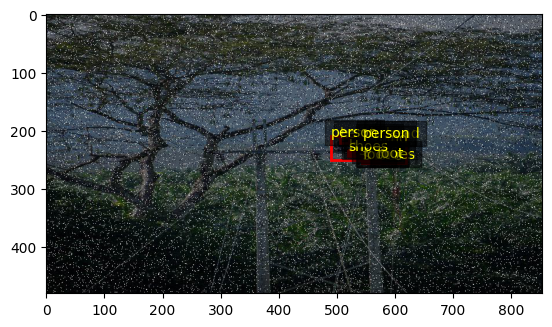

Visualizing: pexels-photo-6873080.jpeg
Image size: 854 x 480
Bounding Box - Class: face, X: 371.063427, Y: 95.52, Width: 109.169382, Height: 69.47999999999999
Bounding Box - Class: head, X: 355.406191, Y: 6.479999999999992, Width: 167.099618, Height: 159.36
Bounding Box - Class: ear, X: 449.20357299999995, Y: 86.76, Width: 27.470618, Height: 31.080000000000002
Bounding Box - Class: hand, X: 494.18119100000007, Y: 256.56000000000006, Width: 73.159618, Height: 55.440000000000005
Bounding Box - Class: hand, X: 426.003382, Y: 235.44000000000003, Width: 62.342, Height: 52.68
Bounding Box - Class: person, X: 355.54880899999995, Y: 6.119999999999992, Width: 498.45161800000005, Height: 472.56
Bounding Box - Class: tool, X: 351.421, Y: 238.91999999999996, Width: 136.64000000000001, Height: 77.64
Displaying image...


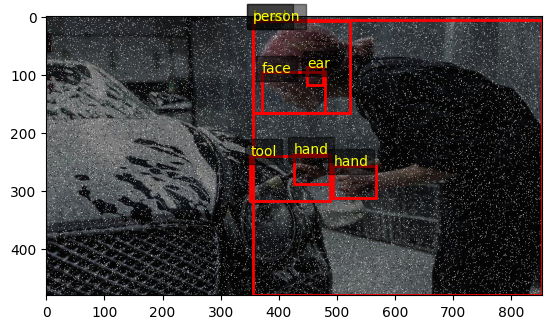

Visualizing: pexels-photo-5327578.jpeg
Image size: 854 x 480
Bounding Box - Class: head, X: 504.855337, Y: 32.481120000000004, Width: 148.219386, Height: 143.23296
Bounding Box - Class: head, X: 94.576657, Y: 0.1127999999999929, Width: 181.662026, Height: 140.86464
Bounding Box - Class: ear, X: 594.214481, Y: 100.94016, Width: 21.002422, Height: 22.78176
Bounding Box - Class: ear, X: 203.60085899999999, Y: 65.86464000000001, Width: 29.429693999999998, Height: 36.31584
Bounding Box - Class: hand, X: 429.0069, Y: 376.57919999999996, Width: 49.629356, Height: 80.63904000000001
Bounding Box - Class: tool, X: 495.357576, Y: 151.46615999999997, Width: 205.205952, Height: 173.12016
Bounding Box - Class: face-mask-medical, X: 504.855337, Y: 99.02232, Width: 99.927394, Height: 66.20304
Bounding Box - Class: face-mask-medical, X: 202.53037, Y: 66.09024000000001, Width: 67.956196, Height: 75.0
Bounding Box - Class: medical-suit, X: 455.225981, Y: 165.4512, Width: 348.34233, Height: 314.5487999999

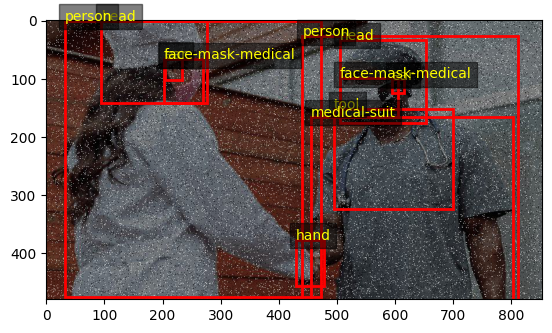

Visualizing: pexels-photo-5684642.jpeg
Image size: 854 x 480
Bounding Box - Class: head, X: 348.68136799999996, Y: 135.95376, Width: 80.819144, Height: 95.22336
Bounding Box - Class: head, X: 505.845123, Y: 42.72816, Width: 111.883394, Height: 113.75712
Bounding Box - Class: head, X: 622.861911, Y: 143.16791999999998, Width: 83.715058, Height: 103.99056
Bounding Box - Class: face-mask-medical, X: 351.709225, Y: 177.79440000000002, Width: 73.711302, Height: 53.0496
Bounding Box - Class: face-mask-medical, X: 526.6421579999999, Y: 104.43480000000001, Width: 68.84094, Height: 52.38384
Bounding Box - Class: face-mask-medical, X: 628.653312, Y: 189.78024, Width: 70.552356, Height: 56.934239999999996
Bounding Box - Class: ear, X: 348.154877, Y: 177.23927999999998, Width: 10.793705999999998, Height: 23.3064
Bounding Box - Class: ear, X: 418.44420099999996, Y: 183.67631999999998, Width: 11.188254, Height: 22.30752
Bounding Box - Class: ear, X: 520.85033, Y: 100.66127999999999, Width: 10.003756

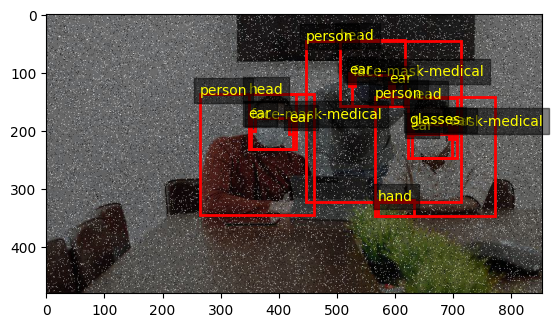

Visualizing: pexels-photo-8246485.jpeg
Image size: 854 x 480
Bounding Box - Class: head, X: 560.574567, Y: 199.49975999999998, Width: 16.559914, Height: 18.23088
Bounding Box - Class: head, X: 364.865522, Y: 193.73088, Width: 6.295688, Height: 6.692159999999999
Bounding Box - Class: hand, X: 549.078019, Y: 238.73064, Width: 9.169398, Height: 6.92304
Bounding Box - Class: hand, X: 585.345264, Y: 239.76912, Width: 8.348704, Height: 8.30784
Bounding Box - Class: glasses, X: 562.353449, Y: 205.03848, Width: 14.233618000000002, Height: 4.6152
Bounding Box - Class: face-mask-medical, X: 561.943102, Y: 208.03872, Width: 15.054312000000001, Height: 9.692160000000001
Bounding Box - Class: person, X: 541.55129, Y: 199.26912, Width: 53.375, Height: 108.57696
Bounding Box - Class: person, X: 361.85474500000004, Y: 193.73064, Width: 23.95043, Height: 41.76912
Displaying image...


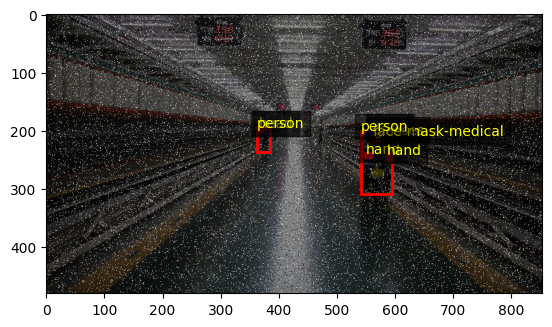

In [15]:
#Visualize 480p quality adjusted image
images = "foruse/sets/set1/set1_480p/quality_adjusted/images"
labels = "foruse/sets/set1/set1_480p/quality_adjusted/labels"

visualize(images,labels)


Visualizing: pexels-photo-10676692.jpeg
Image size: 854 x 480
Bounding Box - Class: head, X: 504.92750000000007, Y: 211.04016, Width: 16.8665, Height: 10.559999999999999
Bounding Box - Class: head, X: 584.563, Y: 211.04016000000001, Width: 13.877500000000001, Height: 9.36
Bounding Box - Class: hand, X: 543.3575, Y: 215.76, Width: 9.6075, Height: 4.56
Bounding Box - Class: hand, X: 564.2805, Y: 219.68016, Width: 10.461500000000001, Height: 5.279999999999999
Bounding Box - Class: hand, X: 521.3670000000001, Y: 232.39992, Width: 8.967, Height: 5.120159999999999
Bounding Box - Class: shoes, X: 536.5255, Y: 240.95976000000002, Width: 13.0235, Height: 9.920160000000001
Bounding Box - Class: shoes, X: 543.3575, Y: 248.08008000000004, Width: 21.990499999999997, Height: 5.6798399999999996
Bounding Box - Class: shoes, X: 566.8425, Y: 246.55992, Width: 8.113, Height: 4.40016
Bounding Box - Class: foot, X: 544.2115, Y: 247.36008, Width: 20.923000000000002, Height: 6.399839999999999
Bounding Box - 

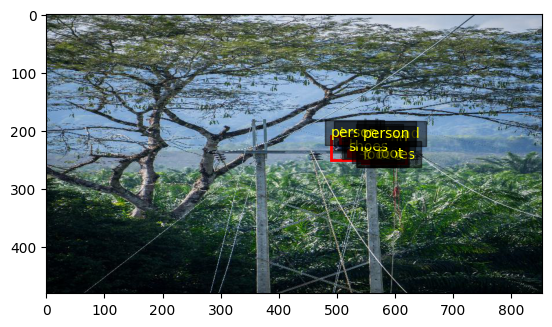

Visualizing: pexels-photo-6873080.jpeg
Image size: 854 x 480
Bounding Box - Class: face, X: 371.063427, Y: 95.52, Width: 109.169382, Height: 69.47999999999999
Bounding Box - Class: head, X: 355.406191, Y: 6.479999999999992, Width: 167.099618, Height: 159.36
Bounding Box - Class: ear, X: 449.20357299999995, Y: 86.76, Width: 27.470618, Height: 31.080000000000002
Bounding Box - Class: hand, X: 494.18119100000007, Y: 256.56000000000006, Width: 73.159618, Height: 55.440000000000005
Bounding Box - Class: hand, X: 426.003382, Y: 235.44000000000003, Width: 62.342, Height: 52.68
Bounding Box - Class: person, X: 355.54880899999995, Y: 6.119999999999992, Width: 498.45161800000005, Height: 472.56
Bounding Box - Class: tool, X: 351.421, Y: 238.91999999999996, Width: 136.64000000000001, Height: 77.64
Displaying image...


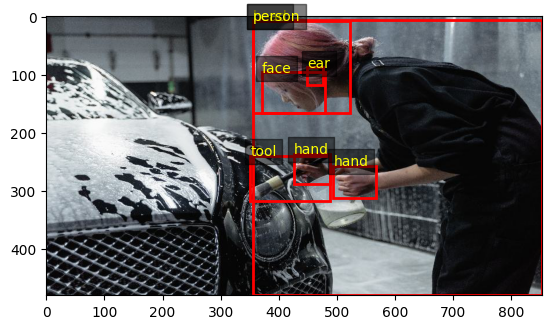

Visualizing: pexels-photo-5327578.jpeg
Image size: 854 x 480
Bounding Box - Class: head, X: 504.855337, Y: 32.481120000000004, Width: 148.219386, Height: 143.23296
Bounding Box - Class: head, X: 94.576657, Y: 0.1127999999999929, Width: 181.662026, Height: 140.86464
Bounding Box - Class: ear, X: 594.214481, Y: 100.94016, Width: 21.002422, Height: 22.78176
Bounding Box - Class: ear, X: 203.60085899999999, Y: 65.86464000000001, Width: 29.429693999999998, Height: 36.31584
Bounding Box - Class: hand, X: 429.0069, Y: 376.57919999999996, Width: 49.629356, Height: 80.63904000000001
Bounding Box - Class: tool, X: 495.357576, Y: 151.46615999999997, Width: 205.205952, Height: 173.12016
Bounding Box - Class: face-mask-medical, X: 504.855337, Y: 99.02232, Width: 99.927394, Height: 66.20304
Bounding Box - Class: face-mask-medical, X: 202.53037, Y: 66.09024000000001, Width: 67.956196, Height: 75.0
Bounding Box - Class: medical-suit, X: 455.225981, Y: 165.4512, Width: 348.34233, Height: 314.5487999999

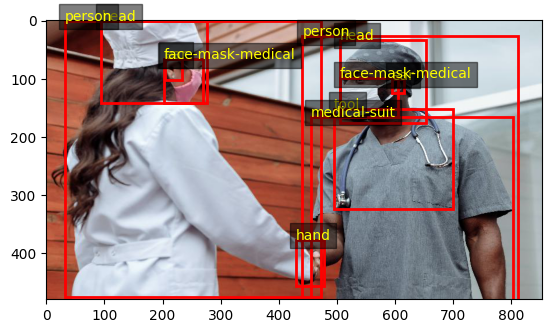

Visualizing: pexels-photo-5684642.jpeg
Image size: 854 x 480
Bounding Box - Class: head, X: 348.68136799999996, Y: 135.95376, Width: 80.819144, Height: 95.22336
Bounding Box - Class: head, X: 505.845123, Y: 42.72816, Width: 111.883394, Height: 113.75712
Bounding Box - Class: head, X: 622.861911, Y: 143.16791999999998, Width: 83.715058, Height: 103.99056
Bounding Box - Class: face-mask-medical, X: 351.709225, Y: 177.79440000000002, Width: 73.711302, Height: 53.0496
Bounding Box - Class: face-mask-medical, X: 526.6421579999999, Y: 104.43480000000001, Width: 68.84094, Height: 52.38384
Bounding Box - Class: face-mask-medical, X: 628.653312, Y: 189.78024, Width: 70.552356, Height: 56.934239999999996
Bounding Box - Class: ear, X: 348.154877, Y: 177.23927999999998, Width: 10.793705999999998, Height: 23.3064
Bounding Box - Class: ear, X: 418.44420099999996, Y: 183.67631999999998, Width: 11.188254, Height: 22.30752
Bounding Box - Class: ear, X: 520.85033, Y: 100.66127999999999, Width: 10.003756

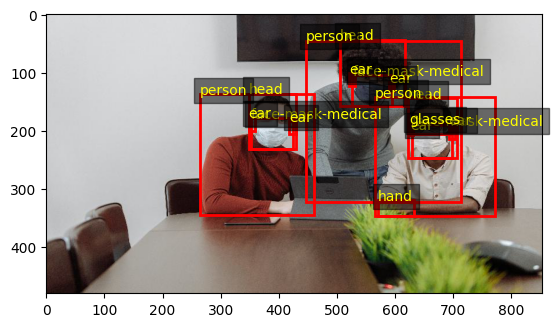

Visualizing: pexels-photo-8246485.jpeg
Image size: 854 x 480
Bounding Box - Class: head, X: 560.574567, Y: 199.49975999999998, Width: 16.559914, Height: 18.23088
Bounding Box - Class: head, X: 364.865522, Y: 193.73088, Width: 6.295688, Height: 6.692159999999999
Bounding Box - Class: hand, X: 549.078019, Y: 238.73064, Width: 9.169398, Height: 6.92304
Bounding Box - Class: hand, X: 585.345264, Y: 239.76912, Width: 8.348704, Height: 8.30784
Bounding Box - Class: glasses, X: 562.353449, Y: 205.03848, Width: 14.233618000000002, Height: 4.6152
Bounding Box - Class: face-mask-medical, X: 561.943102, Y: 208.03872, Width: 15.054312000000001, Height: 9.692160000000001
Bounding Box - Class: person, X: 541.55129, Y: 199.26912, Width: 53.375, Height: 108.57696
Bounding Box - Class: person, X: 361.85474500000004, Y: 193.73064, Width: 23.95043, Height: 41.76912
Displaying image...


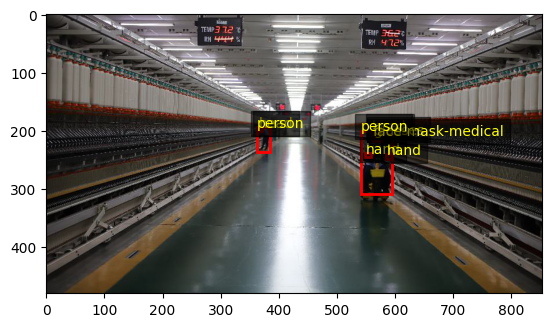

In [16]:
#Visualize 480p original image
images = "foruse/sets/set1/set1_480p/images"
labels = "foruse/sets/set1/set1_480p/labels"

visualize(images,labels)

In [1]:
import os
import shutil
from sklearn.model_selection import train_test_split

# Directories
input_dir = "foruse/sets/set1/set1_480p/quality_adjusted/images"
output_base_dir = "foruse/sets/set1/set1_480p/quality_adjusted/split"

# Create output directories for train, validation, and test sets
for split in ["train", "val", "test"]:
    os.makedirs(os.path.join(output_base_dir, split), exist_ok=True)

# Get all image filenames
image_filenames = [f for f in os.listdir(input_dir) if f.endswith(('.jpg', '.jpeg', '.png'))]

# Split into train, validation, and test sets (70%, 15%, 15%)
train_files, test_files = train_test_split(image_filenames, test_size=0.3, random_state=42)
val_files, test_files = train_test_split(test_files, test_size=0.5, random_state=42)

# Function to copy files to the respective directories
def copy_files(file_list, split):
    for filename in file_list:
        src_path = os.path.join(input_dir, filename)
        dst_path = os.path.join(output_base_dir, split, filename)
        shutil.copy(src_path, dst_path)

# Copy files to the respective directories
copy_files(train_files, "train")
copy_files(val_files, "val")
copy_files(test_files, "test")

print("Images have been successfully split into 'train', 'val', and 'test' sets!")

Images have been successfully split into 'train', 'val', and 'test' sets!


In [5]:
label_folder = "foruse/sets/set1/set1_480p/quality_adjusted/labels"
image_folder_train = "foruse/sets/set1/set1_480p/quality_adjusted/split/train"
image_folder_val = "foruse/sets/set1/set1_480p/quality_adjusted/split/val"
image_folder_test = "foruse/sets/set1/set1_480p/quality_adjusted/split/test"
destination_folder_train = "foruse/sets/set1/set1_480p/quality_adjusted/train_labels"
destination_folder_val = "foruse/sets/set1/set1_480p/quality_adjusted/val_labels" 
destination_folder_test = "foruse/sets/set1/set1_480p/quality_adjusted/test_labels"

move_labels(image_folder_train, label_folder, destination_folder_train)
move_labels(image_folder_val, label_folder, destination_folder_val)
move_labels(image_folder_test, label_folder, destination_folder_test)

Moved label: pexels-photo-5409753.txt
Moved label: pexels-photo-13201048.txt
Moved label: pexels-photo-5493658.txt
Moved label: pexels-photo-5668874.txt
Moved label: pexels-photo-7688082.txt
Moved label: pexels-photo-6474493.txt
Moved label: pexels-photo-6077982.txt
Moved label: pexels-photo-8376243.txt
Moved label: pexels-photo-4489704.txt
Moved label: pexels-photo-7088534.txt
Moved label: pexels-photo-7519285.txt
Moved label: pexels-photo-8518810.txt
Moved label: pexels-photo-4349948.txt
Moved label: pexels-photo-3831159.txt
Moved label: pexels-photo-12725399.txt
Moved label: pexels-photo-15016508.txt
Moved label: pexels-photo-7643755.txt
Moved label: pexels-photo-6873080.txt
Moved label: pexels-photo-5327578.txt
Moved label: pexels-photo-8246485.txt
Moved label: pexels-photo-7674867.txt
Moved label: pexels-photo-6912864.txt
Moved label: pexels-photo-5529746.txt
Moved label: pexels-photo-7388936.txt
Moved label: pexels-photo-17703052.txt
Moved label: pexels-photo-7888976.txt
Moved la

#### 1080p

In [6]:
# Function to add Gaussian noise
def add_gaussian_noise(input_image, mean=0, std=15):
    img_array = np.array(input_image)
    noise = np.random.normal(mean, std, img_array.shape).astype('float32')
    noisy_image = img_array + noise
    noisy_image = np.clip(noisy_image, 0, 255).astype('uint8')
    return Image.fromarray(noisy_image)

In [8]:
# Directories
input_dir = "foruse/sets/set1/set1_1080p/images"
output_dir = "foruse/sets/set1/set1_1080p/quality_adjusted/images"
os.makedirs(output_dir, exist_ok=True)

# Parameters for mid-quality simulation
brightness_factor = 0.8  # Moderate brightness
noise_std = 15           # Moderate Gaussian noise

# Process each image
image_filenames = [f for f in os.listdir(input_dir) if f.endswith((".jpg", ".jpeg", ".png"))]
for image_file in image_filenames:
    img_path = os.path.join(input_dir, image_file)
    output_path = os.path.join(output_dir, image_file)

    with Image.open(img_path) as img:
        # Adjust brightness
        img = adjust_brightness(img, brightness_factor)

        # Add Gaussian noise
        img = add_gaussian_noise(img, mean=0, std=noise_std)

        # Save the processed image
        img.save(output_path)

print(f"Processed 1080p images with adjustments saved in {output_dir}. Total images processed: {len(image_filenames)}")


Processed 1080p images with adjustments saved in foruse/sets/set1/set1_1080p/quality_adjusted/images. Total images processed: 2086


In [9]:
#Paths
origin = "foruse/sets/set1/set1_1080p/labels"
destination = "foruse/sets/set1/set1_1080p/quality_adjusted/labels"

movelabels(origin,destination)


Labels copied to: foruse/sets/set1/set1_1080p/quality_adjusted/labels


Visualizing: pexels-photo-7888976.jpeg
Image size: 1920 x 1080
Bounding Box - Class: head, X: 176.33088, Y: 234.54954000000004, Width: 224.54399999999998, Height: 129.57948000000002
Bounding Box - Class: face, X: 223.20383999999999, Y: 252.46296000000004, Width: 177.22368, Height: 110.16
Bounding Box - Class: face, X: 1512.42912, Y: 218.64492, Width: 174.09984, Height: 90.73944
Bounding Box - Class: head, X: 1491.44736, Y: 186.33402, Width: 221.8656, Height: 120.53988
Bounding Box - Class: hand, X: 528.5472, Y: 439.80138, Width: 177.22368, Height: 46.708920000000006
Bounding Box - Class: hand, X: 248.64959999999996, Y: 378.86238000000003, Width: 209.36448000000001, Height: 53.57340000000001
Bounding Box - Class: hand, X: 770.9472, Y: 338.68206, Width: 99.54816, Height: 63.45108
Bounding Box - Class: hand, X: 1474.03872, Y: 437.29037999999997, Width: 199.09824, Height: 82.70316000000001
Bounding Box - Class: hand, X: 1806.16608, Y: 498.39786, Width: 113.83488, Height: 73.82988
Bounding 

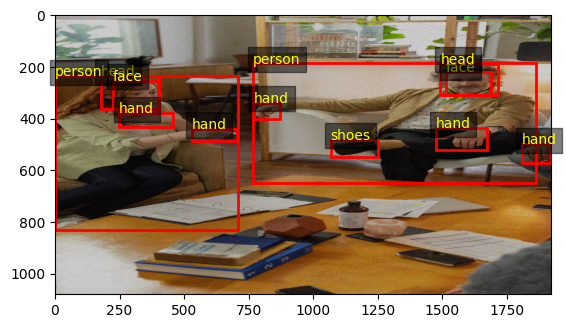

Visualizing: pexels-photo-7279342.jpeg
Image size: 1920 x 1080
Bounding Box - Class: head, X: 693.00096, Y: 449.35668, Width: 430.7136, Height: 227.89296000000002
Bounding Box - Class: face, X: 710.14368, Y: 530.99982, Width: 378.0, Height: 146.4102
Bounding Box - Class: head, X: 1351.2854399999999, Y: 411.74946, Width: 380.99904, Height: 179.19683999999998
Bounding Box - Class: face, X: 1352.1436800000001, Y: 444.37518, Width: 318.0, Height: 145.92852
Bounding Box - Class: ear, X: 1361.14176, Y: 454.98186000000004, Width: 39.42912, Height: 50.30316
Bounding Box - Class: ear, X: 699.42912, Y: 522.48186, Width: 94.7136, Height: 54.96444
Bounding Box - Class: hand, X: 946.7136, Y: 822.5361, Width: 285.00095999999996, Height: 74.08908
Bounding Box - Class: hand, X: 1150.28544, Y: 792.64278, Width: 250.7136, Height: 91.44684
Bounding Box - Class: hand, X: 1456.71456, Y: 762.75054, Width: 250.28544, Height: 58.982040000000005
Bounding Box - Class: hand, X: 1248.0, Y: 535.3392600000001, Widt

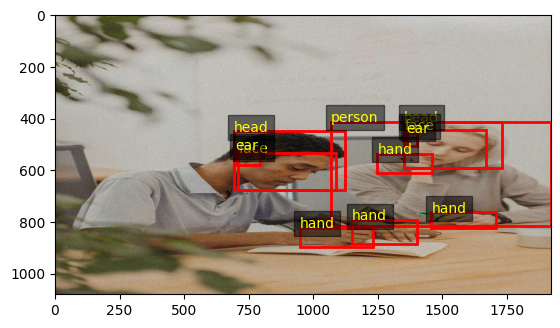

Visualizing: pexels-photo-5720979.jpeg
Image size: 1920 x 1080
Bounding Box - Class: face, X: 499.6176, Y: 434.75562, Width: 101.36256, Height: 173.84652
Bounding Box - Class: ear, X: 472.15296000000006, Y: 520.9898400000001, Width: 37.60128, Height: 48.48984
Bounding Box - Class: head, X: 378.31104000000005, Y: 390.39786000000004, Width: 224.95872, Height: 224.81604
Bounding Box - Class: hand, X: 539.1830400000001, Y: 915.2443800000001, Width: 181.79904, Height: 91.74492
Bounding Box - Class: hand, X: 611.44512, Y: 885.21444, Width: 176.89344, Height: 56.47968
Bounding Box - Class: person, X: 134.38656, Y: 384.06096, Width: 754.9862400000001, Height: 695.93904
Displaying image...


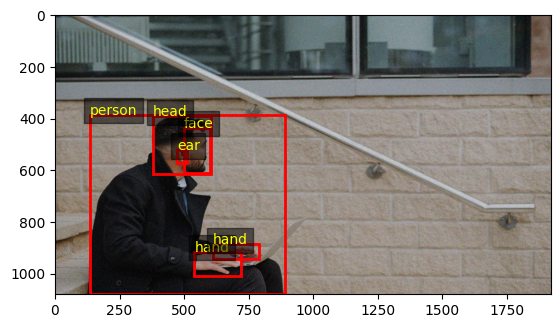

Visualizing: pexels-photo-5974384.jpeg
Image size: 1920 x 1080
Bounding Box - Class: hand, X: 896.6390399999999, Y: 833.76, Width: 262.40064, Height: 124.74000000000001
Bounding Box - Class: hand, X: 1245.76032, Y: 832.6800000000001, Width: 271.35936, Height: 113.13
Bounding Box - Class: head, X: 963.2006400000001, Y: 76.41000000000001, Width: 404.15999999999997, Height: 344.78999999999996
Bounding Box - Class: face, X: 964.1606400000001, Y: 242.45999999999998, Width: 293.76, Height: 179.28
Bounding Box - Class: tool, X: 718.07904, Y: 948.51, Width: 226.88064, Height: 127.16999999999999
Bounding Box - Class: tool, X: 1013.11968, Y: 949.8599999999999, Width: 184.64064000000002, Height: 98.00999999999999
Bounding Box - Class: tool, X: 1551.68064, Y: 808.3800000000001, Width: 221.76000000000002, Height: 62.370000000000005
Bounding Box - Class: glasses, X: 1091.19936, Y: 266.21999999999997, Width: 123.84, Height: 145.53
Bounding Box - Class: person, X: 410.56032000000005, Y: 77.49000000000

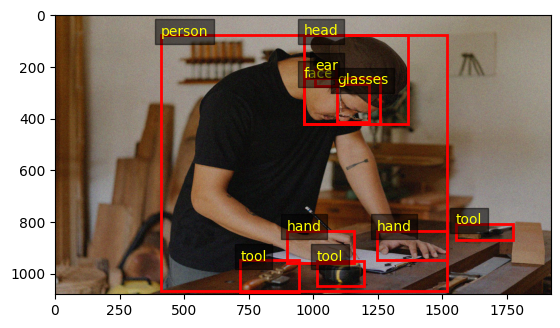

Visualizing: pexels-photo-4560147.jpeg
Image size: 1920 x 1080
Bounding Box - Class: face, X: 649.91904, Y: 327.78, Width: 133.76064000000002, Height: 143.91
Bounding Box - Class: head, X: 645.75936, Y: 314.01, Width: 292.8, Height: 203.31
Bounding Box - Class: ear, X: 762.8803199999999, Y: 381.23999999999995, Width: 38.72064, Height: 52.38
Bounding Box - Class: hand, X: 685.75968, Y: 404.73, Width: 125.43936000000001, Height: 85.05
Bounding Box - Class: hand, X: 393.91967999999997, Y: 692.0099999999999, Width: 135.03936000000002, Height: 66.96
Bounding Box - Class: person, X: 158.40000000000003, Y: 293.75999999999993, Width: 786.24, Height: 740.61
Displaying image...


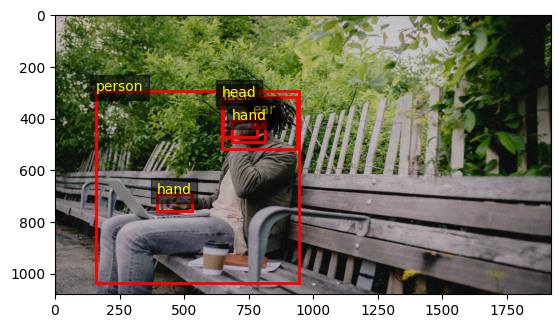

Visualizing: pexels-photo-13925900.jpeg
Image size: 1920 x 1080
Bounding Box - Class: head, X: 1115.736, Y: 379.85274000000004, Width: 78.08832, Height: 86.02956
Bounding Box - Class: head, X: 1155.0, Y: 237.90402, Width: 62.20607999999999, Height: 71.80164
Bounding Box - Class: face, X: 1131.61824, Y: 405.99252, Width: 58.23552, Height: 51.287040000000005
Bounding Box - Class: face, X: 1167.79488, Y: 276.61716, Width: 42.35328, Height: 26.4708
Bounding Box - Class: ear, X: 1118.82432, Y: 412.27865999999995, Width: 15.440640000000002, Height: 21.83868
Bounding Box - Class: hand, X: 1023.5299200000002, Y: 595.58814, Width: 37.94112, Height: 38.05164
Bounding Box - Class: hand, X: 1031.47104, Y: 609.15456, Width: 42.35328, Height: 39.04416
Bounding Box - Class: hand, X: 1191.61824, Y: 425.51460000000003, Width: 30.4416, Height: 41.0292
Bounding Box - Class: hand, X: 1138.2345599999999, Y: 341.47062, Width: 42.35328, Height: 27.132839999999998
Bounding Box - Class: shoes, X: 1059.70656, Y

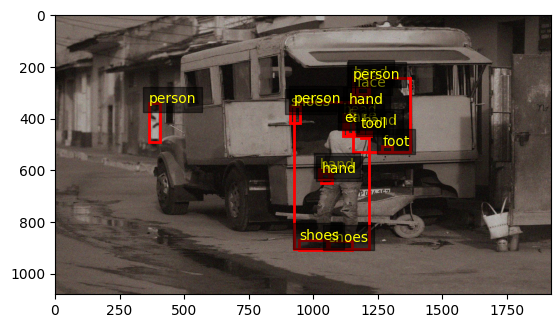

In [10]:
#Visualize 480p original image
images = "foruse/sets/set1/set1_1080p/quality_adjusted//images"
labels = "foruse/sets/set1/set1_1080p/quality_adjusted/labels"

visualize(images,labels,34,6)

Visualizing: pexels-photo-7888976.jpeg
Image size: 1920 x 1080
Bounding Box - Class: head, X: 176.33088, Y: 234.54954000000004, Width: 224.54399999999998, Height: 129.57948000000002
Bounding Box - Class: face, X: 223.20383999999999, Y: 252.46296000000004, Width: 177.22368, Height: 110.16
Bounding Box - Class: face, X: 1512.42912, Y: 218.64492, Width: 174.09984, Height: 90.73944
Bounding Box - Class: head, X: 1491.44736, Y: 186.33402, Width: 221.8656, Height: 120.53988
Bounding Box - Class: hand, X: 528.5472, Y: 439.80138, Width: 177.22368, Height: 46.708920000000006
Bounding Box - Class: hand, X: 248.64959999999996, Y: 378.86238000000003, Width: 209.36448000000001, Height: 53.57340000000001
Bounding Box - Class: hand, X: 770.9472, Y: 338.68206, Width: 99.54816, Height: 63.45108
Bounding Box - Class: hand, X: 1474.03872, Y: 437.29037999999997, Width: 199.09824, Height: 82.70316000000001
Bounding Box - Class: hand, X: 1806.16608, Y: 498.39786, Width: 113.83488, Height: 73.82988
Bounding 

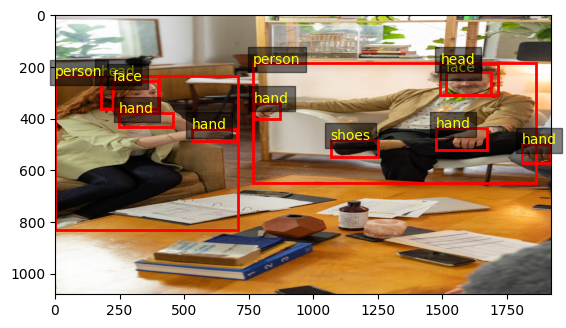

Visualizing: pexels-photo-7279342.jpeg
Image size: 1920 x 1080
Bounding Box - Class: head, X: 693.00096, Y: 449.35668, Width: 430.7136, Height: 227.89296000000002
Bounding Box - Class: face, X: 710.14368, Y: 530.99982, Width: 378.0, Height: 146.4102
Bounding Box - Class: head, X: 1351.2854399999999, Y: 411.74946, Width: 380.99904, Height: 179.19683999999998
Bounding Box - Class: face, X: 1352.1436800000001, Y: 444.37518, Width: 318.0, Height: 145.92852
Bounding Box - Class: ear, X: 1361.14176, Y: 454.98186000000004, Width: 39.42912, Height: 50.30316
Bounding Box - Class: ear, X: 699.42912, Y: 522.48186, Width: 94.7136, Height: 54.96444
Bounding Box - Class: hand, X: 946.7136, Y: 822.5361, Width: 285.00095999999996, Height: 74.08908
Bounding Box - Class: hand, X: 1150.28544, Y: 792.64278, Width: 250.7136, Height: 91.44684
Bounding Box - Class: hand, X: 1456.71456, Y: 762.75054, Width: 250.28544, Height: 58.982040000000005
Bounding Box - Class: hand, X: 1248.0, Y: 535.3392600000001, Widt

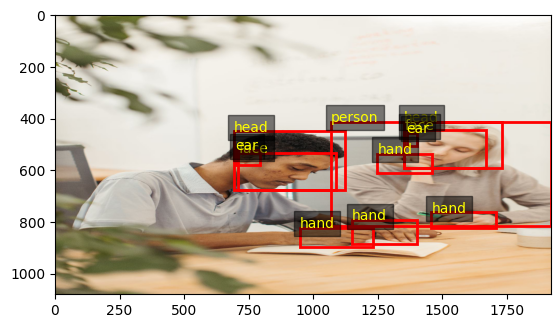

Visualizing: pexels-photo-5720979.jpeg
Image size: 1920 x 1080
Bounding Box - Class: face, X: 499.6176, Y: 434.75562, Width: 101.36256, Height: 173.84652
Bounding Box - Class: ear, X: 472.15296000000006, Y: 520.9898400000001, Width: 37.60128, Height: 48.48984
Bounding Box - Class: head, X: 378.31104000000005, Y: 390.39786000000004, Width: 224.95872, Height: 224.81604
Bounding Box - Class: hand, X: 539.1830400000001, Y: 915.2443800000001, Width: 181.79904, Height: 91.74492
Bounding Box - Class: hand, X: 611.44512, Y: 885.21444, Width: 176.89344, Height: 56.47968
Bounding Box - Class: person, X: 134.38656, Y: 384.06096, Width: 754.9862400000001, Height: 695.93904
Displaying image...


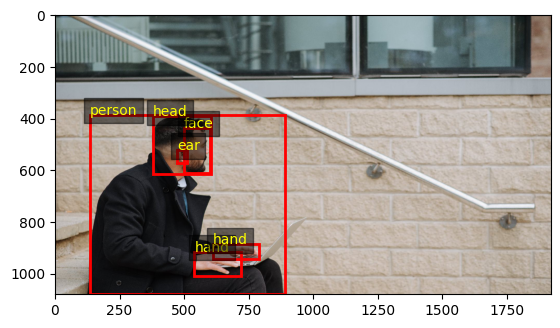

Visualizing: pexels-photo-5974384.jpeg
Image size: 1920 x 1080
Bounding Box - Class: hand, X: 896.6390399999999, Y: 833.76, Width: 262.40064, Height: 124.74000000000001
Bounding Box - Class: hand, X: 1245.76032, Y: 832.6800000000001, Width: 271.35936, Height: 113.13
Bounding Box - Class: head, X: 963.2006400000001, Y: 76.41000000000001, Width: 404.15999999999997, Height: 344.78999999999996
Bounding Box - Class: face, X: 964.1606400000001, Y: 242.45999999999998, Width: 293.76, Height: 179.28
Bounding Box - Class: tool, X: 718.07904, Y: 948.51, Width: 226.88064, Height: 127.16999999999999
Bounding Box - Class: tool, X: 1013.11968, Y: 949.8599999999999, Width: 184.64064000000002, Height: 98.00999999999999
Bounding Box - Class: tool, X: 1551.68064, Y: 808.3800000000001, Width: 221.76000000000002, Height: 62.370000000000005
Bounding Box - Class: glasses, X: 1091.19936, Y: 266.21999999999997, Width: 123.84, Height: 145.53
Bounding Box - Class: person, X: 410.56032000000005, Y: 77.49000000000

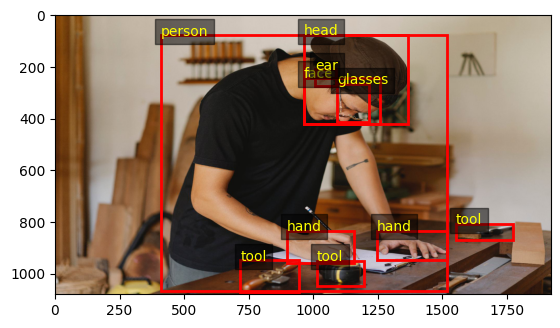

Visualizing: pexels-photo-4560147.jpeg
Image size: 1920 x 1080
Bounding Box - Class: face, X: 649.91904, Y: 327.78, Width: 133.76064000000002, Height: 143.91
Bounding Box - Class: head, X: 645.75936, Y: 314.01, Width: 292.8, Height: 203.31
Bounding Box - Class: ear, X: 762.8803199999999, Y: 381.23999999999995, Width: 38.72064, Height: 52.38
Bounding Box - Class: hand, X: 685.75968, Y: 404.73, Width: 125.43936000000001, Height: 85.05
Bounding Box - Class: hand, X: 393.91967999999997, Y: 692.0099999999999, Width: 135.03936000000002, Height: 66.96
Bounding Box - Class: person, X: 158.40000000000003, Y: 293.75999999999993, Width: 786.24, Height: 740.61
Displaying image...


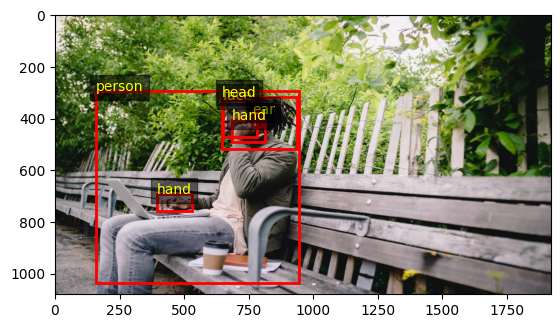

Visualizing: pexels-photo-13925900.jpeg
Image size: 1920 x 1080
Bounding Box - Class: head, X: 1115.736, Y: 379.85274000000004, Width: 78.08832, Height: 86.02956
Bounding Box - Class: head, X: 1155.0, Y: 237.90402, Width: 62.20607999999999, Height: 71.80164
Bounding Box - Class: face, X: 1131.61824, Y: 405.99252, Width: 58.23552, Height: 51.287040000000005
Bounding Box - Class: face, X: 1167.79488, Y: 276.61716, Width: 42.35328, Height: 26.4708
Bounding Box - Class: ear, X: 1118.82432, Y: 412.27865999999995, Width: 15.440640000000002, Height: 21.83868
Bounding Box - Class: hand, X: 1023.5299200000002, Y: 595.58814, Width: 37.94112, Height: 38.05164
Bounding Box - Class: hand, X: 1031.47104, Y: 609.15456, Width: 42.35328, Height: 39.04416
Bounding Box - Class: hand, X: 1191.61824, Y: 425.51460000000003, Width: 30.4416, Height: 41.0292
Bounding Box - Class: hand, X: 1138.2345599999999, Y: 341.47062, Width: 42.35328, Height: 27.132839999999998
Bounding Box - Class: shoes, X: 1059.70656, Y

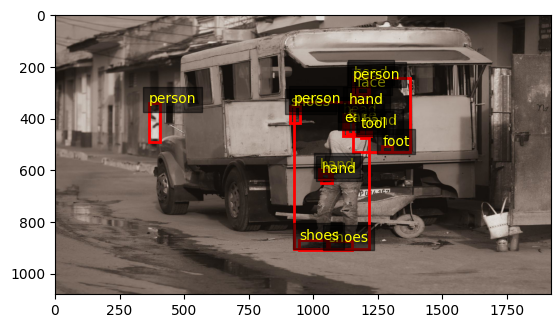

In [11]:
#Visualize 480p original image
images = "foruse/sets/set1/set1_1080p/images"
labels = "foruse/sets/set1/set1_1080p/labels"

visualize(images,labels,34,6)

In [ ]:
images = "foruse/sets/set1/set1_1080p/quality_adjusted//images"
labels = "foruse/sets/set1/set1_1080p/quality_adjusted/labels"
image_folder_train = "foruse/sets/set1/set1_480p/quality_adjusted/split/train"
image_folder_val = "foruse/sets/set1/set1_480p/quality_adjusted/split/val"
image_folder_test = "foruse/sets/set1/set1_480p/quality_adjusted/split/test"


In [6]:

def create_split_sets_1080p(src_dir_1080p, dest_base_dir_1080p, train_dir_480p, val_dir_480p, test_dir_480p):
    # Create output directories for train, validation, and test sets
    for split in ["train", "val", "test"]:
        os.makedirs(os.path.join(dest_base_dir_1080p, split), exist_ok=True)

    # Function to copy files to the respective directories
    def copy_files(file_list, split):
        for filename in file_list:
            src_path = os.path.join(src_dir_1080p, filename)
            dst_path = os.path.join(dest_base_dir_1080p, split, filename)
            if os.path.exists(src_path):
                shutil.copy(src_path, dst_path)

    # Get all image filenames from the 480p split directories
    train_files = [f for f in os.listdir(train_dir_480p) if f.endswith(('.jpg', '.jpeg', '.png'))]
    val_files = [f for f in os.listdir(val_dir_480p) if f.endswith(('.jpg', '.jpeg', '.png'))]
    test_files = [f for f in os.listdir(test_dir_480p) if f.endswith(('.jpg', '.jpeg', '.png'))]

    # Copy files to the respective directories
    copy_files(train_files, "train")
    copy_files(val_files, "val")
    copy_files(test_files, "test")

    print("1080p images have been successfully split into 'train', 'val', and 'test' sets!")

# Define paths
src_dir_1080p = "foruse/sets/set1/set1_1080p/quality_adjusted/images"
dest_base_dir_1080p = "foruse/sets/set1/set1_1080p/quality_adjusted/split"
train_dir_480p = "foruse/sets/set1/set1_480p/quality_adjusted/split/train"
val_dir_480p = "foruse/sets/set1/set1_480p/quality_adjusted/split/val"
test_dir_480p = "foruse/sets/set1/set1_480p/quality_adjusted/split/test"

# Create the split sets for 1080p images
create_split_sets_1080p(src_dir_1080p, dest_base_dir_1080p, train_dir_480p, val_dir_480p, test_dir_480p)

1080p images have been successfully split into 'train', 'val', and 'test' sets!


In [7]:
label_folder = "foruse/sets/set1/set1_1080p/quality_adjusted/labels"
image_folder_train = "foruse/sets/set1/set1_1080p/quality_adjusted/split/train"
image_folder_val = "foruse/sets/set1/set1_1080p/quality_adjusted/split/val"
image_folder_test = "foruse/sets/set1/set1_1080p/quality_adjusted/split/test"
destination_folder_train = "foruse/sets/set1/set1_1080p/quality_adjusted/train_labels"
destination_folder_val = "foruse/sets/set1/set1_1080p/quality_adjusted/val_labels" 
destination_folder_test = "foruse/sets/set1/set1_1080p/quality_adjusted/test_labels"

move_labels(image_folder_train, label_folder, destination_folder_train)
move_labels(image_folder_val, label_folder, destination_folder_val)
move_labels(image_folder_test, label_folder, destination_folder_test)

Moved label: pexels-photo-5409753.txt
Moved label: pexels-photo-13201048.txt
Moved label: pexels-photo-5493658.txt
Moved label: pexels-photo-5668874.txt
Moved label: pexels-photo-7688082.txt
Moved label: pexels-photo-6474493.txt
Moved label: pexels-photo-6077982.txt
Moved label: pexels-photo-8376243.txt
Moved label: pexels-photo-4489704.txt
Moved label: pexels-photo-7088534.txt
Moved label: pexels-photo-7519285.txt
Moved label: pexels-photo-8518810.txt
Moved label: pexels-photo-4349948.txt
Moved label: pexels-photo-3831159.txt
Moved label: pexels-photo-12725399.txt
Moved label: pexels-photo-15016508.txt
Moved label: pexels-photo-7643755.txt
Moved label: pexels-photo-6873080.txt
Moved label: pexels-photo-5327578.txt
Moved label: pexels-photo-8246485.txt
Moved label: pexels-photo-7674867.txt
Moved label: pexels-photo-6912864.txt
Moved label: pexels-photo-5529746.txt
Moved label: pexels-photo-7388936.txt
Moved label: pexels-photo-17703052.txt
Moved label: pexels-photo-7888976.txt
Moved la

In [10]:
# Train_test_split for 4k

# Define paths
src_dir_4k = "foruse/sets/set1/set1_4k/images"
dest_base_dir_4k = "foruse/sets/set1/set1_4k/split"
train_dir_480p = "foruse/sets/set1/set1_480p/quality_adjusted/split/train"
val_dir_480p = "foruse/sets/set1/set1_480p/quality_adjusted/split/val"
test_dir_480p = "foruse/sets/set1/set1_480p/quality_adjusted/split/test"

# Create the split sets for 1080p images
create_split_sets_1080p(src_dir_4k, dest_base_dir_4k, train_dir_480p, val_dir_480p, test_dir_480p)

1080p images have been successfully split into 'train', 'val', and 'test' sets!


In [11]:
label_folder = "foruse/sets/set1/set1_4k/labels"
image_folder_train = "foruse/sets/set1/set1_4k/split/train"
image_folder_val = "foruse/sets/set1/set1_4k/split/val"
image_folder_test = "foruse/sets/set1/set1_4k/split/test"
destination_folder_train = "foruse/sets/set1/set1_4k/split/train_labels"
destination_folder_val = "foruse/sets/set1/set1_4k/split/val_labels" 
destination_folder_test = "foruse/sets/set1/set1_4k/split/test_labels"

move_labels(image_folder_train, label_folder, destination_folder_train)
move_labels(image_folder_val, label_folder, destination_folder_val)
move_labels(image_folder_test, label_folder, destination_folder_test)

Moved label: pexels-photo-5409753.txt
Moved label: pexels-photo-13201048.txt
Moved label: pexels-photo-5493658.txt
Moved label: pexels-photo-5668874.txt
Moved label: pexels-photo-7688082.txt
Moved label: pexels-photo-6474493.txt
Moved label: pexels-photo-6077982.txt
Moved label: pexels-photo-8376243.txt
Moved label: pexels-photo-4489704.txt
Moved label: pexels-photo-7088534.txt
Moved label: pexels-photo-7519285.txt
Moved label: pexels-photo-8518810.txt
Moved label: pexels-photo-4349948.txt
Moved label: pexels-photo-3831159.txt
Moved label: pexels-photo-12725399.txt
Moved label: pexels-photo-15016508.txt
Moved label: pexels-photo-7643755.txt
Moved label: pexels-photo-6873080.txt
Moved label: pexels-photo-5327578.txt
Moved label: pexels-photo-8246485.txt
Moved label: pexels-photo-7674867.txt
Moved label: pexels-photo-6912864.txt
Moved label: pexels-photo-5529746.txt
Moved label: pexels-photo-7388936.txt
Moved label: pexels-photo-17703052.txt
Moved label: pexels-photo-7888976.txt
Moved la